In [1]:
import sys
sys.path.append('../src/training-on-CM2.6')

import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import cartopy.crs as ccrs
from matplotlib.colors import LinearSegmentedColormap
import cmocean

from helpers.cm26 import DatasetCM26, read_datasets, create_grid
from helpers.selectors import *
from helpers.plot_helpers import *

%load_ext autoreload
%autoreload 3

# Plot snapshot of predictions

## Read from the disk ANN skill on testing dataset

In [2]:
def read_skill(exp='subfilter/FGR3/EXP1', factors=[4,9,12,15], base_path='/scratch/pp2681/mom6/CM26_ML_models/ocean3d/', test='test'):
    ds = {}
    for factor in factors:
        data = xr.open_dataset(f'{base_path}/{exp}/skill-{test}/factor-{factor}.nc', chunks={'zl':1})
        data['zl'] = -data['zl']
        ds[factor] = data
        
    return ds

In [3]:
# Default ANN tested in online simulations
ann_default = read_skill('subfilter/FGR3/EXP1')

# Relation of model errors and normalization factor

In [3]:
skill = {}
# Both ANNs are trained on coarsegraining factor 9 and upper fluid layer (i.e., depth index is 0)
# The first ANN uses dimensional scaling, the second does not
for key in ['factor-9-depth-0']:
    skill[key] = read_skill(f'subfilter-large/FGR3/dimensional-scaling/32-32/{key}');

for key in ['dx-input-factor-9-depth-0', 'no-scaling-factor-9-depth-0']:
    skill[key] = read_skill(f'subfilter/FGR3/dimensional-scaling/32-32/{key}');

# Read grid information
training_data = read_datasets(['test'], factors=[4,9], subfilter='subfilter')
param_4 = training_data['test-4'].param
param_9 = training_data['test-9'].param

grid_4 = create_grid(param_4)
grid_9 = create_grid(param_9)

Reading from folder /vast/pp2681/CM26_datasets/ocean3d/subfilter/FGR3/factor-4
Reading from folder /vast/pp2681/CM26_datasets/ocean3d/subfilter/FGR3/factor-9


In [4]:
data = training_data['test-9'].data.isel(time=0)
Xsqr = ((data.rel_vort_h**2 + data.sh_xy_h**2 + data.sh_xx**2).rolling({'xh':3,'yh':3}).sum())

ann_scaling = skill['factor-9-depth-0'][9]
ann_dx_input = skill['dx-input-factor-9-depth-0'][9]
error_scaling = np.sqrt(grid_9.interp((ann_scaling.SGSx - ann_scaling.ZB20u)**2,'X') + \
                        grid_9.interp((ann_scaling.SGSy - ann_scaling.ZB20v)**2,'Y'))
                        
error_dx_input = np.sqrt(grid_9.interp((ann_dx_input.SGSx - ann_dx_input.ZB20u)**2,'X') + \
                         grid_9.interp((ann_dx_input.SGSy - ann_dx_input.ZB20v)**2,'Y'))

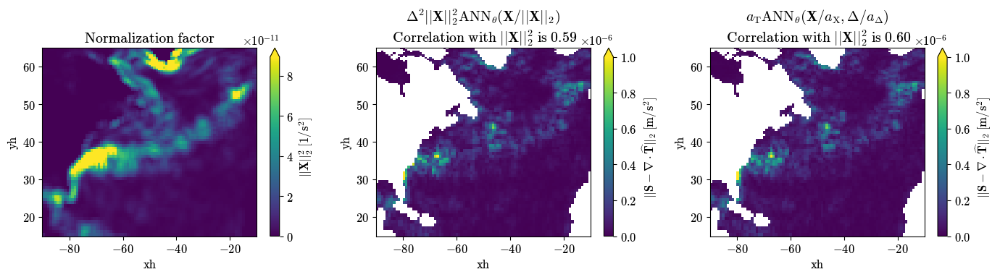

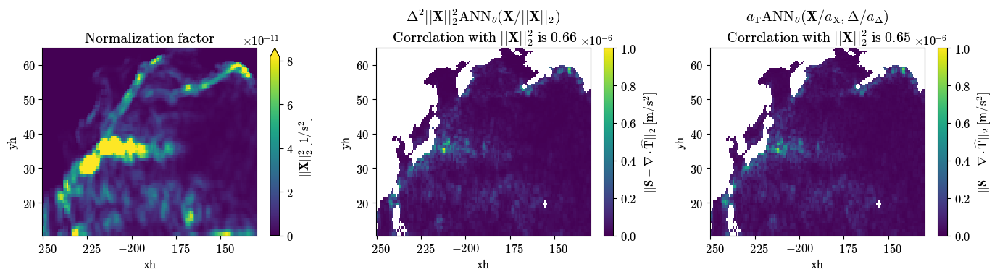

In [12]:
default_rcParams({'figure.subplot.wspace': 0.0, 'figure.subplot.hspace': 0.14, 'font.size':12})
for region in [select_NA, select_Pacific]:
    plt.figure(figsize=(14,4))
    plt.subplot(1,3,1)
    target = region(Xsqr[0])
    target.plot(robust=True, cbar_kwargs={'label':'$||\mathbf{X}||_2^2$ [1/s$^2$]'})
    plt.title('Normalization factor')
    plt.subplot(1,3,2)
    field = region(error_scaling[0])
    field.plot(vmin=0, vmax=1e-6, cbar_kwargs={'label':'$||\\mathbf{S} - \\nabla \\cdot \\widehat{\\mathbf{T}}||_2$ [m/s$^2$]'})
    correlation = float(xr.corr(field, target))
    plt.title('$\\Delta^2 ||\\mathbf{X}||_2^2 \\mathrm{ANN}_{\\theta} (\\mathbf{X} / ||\\mathbf{X}||_2)$\n Correlation with $||\mathbf{X}||_2^2$ is %.2f' % correlation)
    plt.subplot(1,3,3)
    field = region(error_dx_input[0])
    field.plot(vmin=0, vmax=1e-6, cbar_kwargs={'label':'$||\\mathbf{S} - \\nabla \\cdot \\widehat{\\mathbf{T}}||_2$ [m/s$^2$]'})
    correlation = float(xr.corr(field, target))
    plt.title('$a_{\mathrm{T}}\\mathrm{ANN}_{\\theta} (\\mathbf{X} / a_{\mathrm{X}}, \Delta/a_{\Delta})$\n Correlation with $||\mathbf{X}||_2^2$ is %.2f' % correlation)
    plt.tight_layout()

# Offline skill sensitivity

In [15]:
# Default ANN tested in online simulations
ann_default = read_skill('subfilter/FGR3/EXP1')
ann_32_32 = read_skill('subfilter/FGR3/EXP-32-32/repeat')
ann_1x1 = read_skill('subfilter/FGR3/EXP-32-32/1x1')

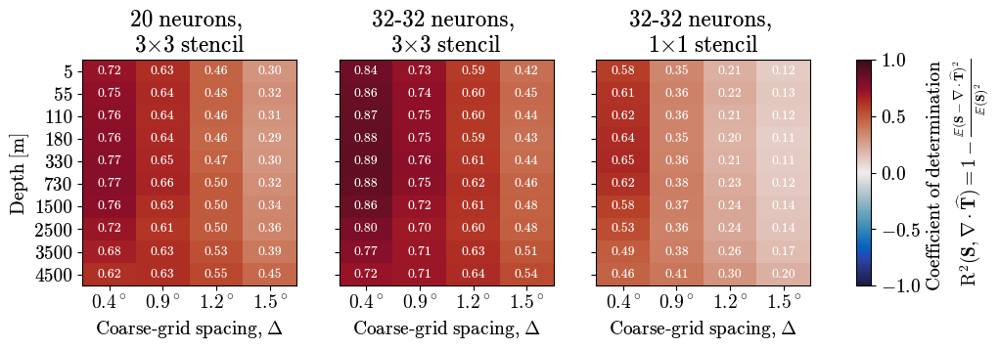

In [17]:
default_rcParams({'figure.subplot.wspace': 0.2, 'figure.subplot.hspace': 0.2, 'font.size':14})
fig = plt.figure(figsize=(12,3))

plt.subplot(1,3,1)
im_R2=plot_metric(ann_default, 'R2_away', ylabel=True, xlabel=True, add_cyan_rectangle=False, add_yellow_rectangle=False, add_orange_rectangle=False);
plt.title('20 neurons, \n3$\\times$3 stencil')
plt.subplot(1,3,2)
im_R2=plot_metric(ann_32_32, 'R2_away', ylabel=False, xlabel=True, add_cyan_rectangle=False, add_yellow_rectangle=False, add_orange_rectangle=False);
plt.title('32-32 neurons, \n3$\\times$3 stencil')
plt.subplot(1,3,3)
im_R2=plot_metric(ann_1x1, 'R2_away', ylabel=False, xlabel=True, add_cyan_rectangle=False, add_yellow_rectangle=False, add_orange_rectangle=False);
plt.title('32-32 neurons, \n1$\\times$1 stencil')


axes = plt.gcf().axes
plt.colorbar(im_R2, ax=axes[0:3], 
             label='Coefficient of determination \n$\mathrm{R}^2(\\mathbf{S},\\nabla\\cdot\\widehat{\\mathbf{T}})=1-\\frac{\\mathbb{E}(\\mathbf{S}-\\nabla\\cdot\\widehat{\\mathbf{T}})^2}{\\mathbb{E}(\\mathbf{S})^2}$', aspect=15)

plt.savefig('figures/offline-metrics-sensitivity.pdf', dpi=200)

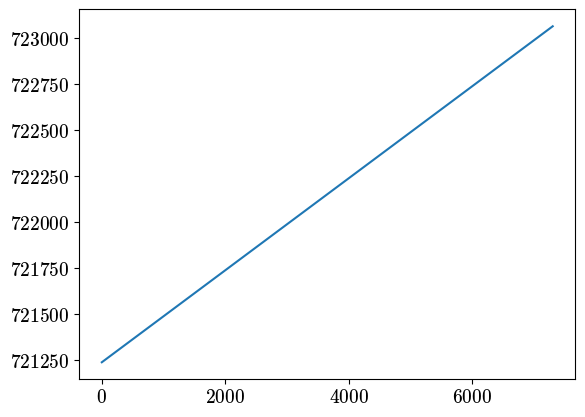

In [63]:
plt.plot(np.unique(series_default.Time))

In [55]:
def time(x):
    x['Time'] = x['Time']-x['Time'].min()
    return x.sortby('Time')

control = time(xr.open_dataset('/scratch/pp2681/mom6/OM4_SIS2/unparameterized/output/ocean.stats.nc', decode_times=False))
series_default = time(xr.open_dataset('/scratch/pp2681/mom6/OM4_SIS2/ANN-greenline/output/ocean.stats.nc', decode_times=False))
series_32_32 = time(xr.open_dataset('/scratch/pp2681/mom6/OM4_SIS2/ANN-3x3-32-32/output/ocean.stats.nc', decode_times=False))
series_1x1 = time(xr.open_dataset('/scratch/pp2681/mom6/OM4_SIS2/ANN-1x1/output/ocean.stats.nc', decode_times=False))

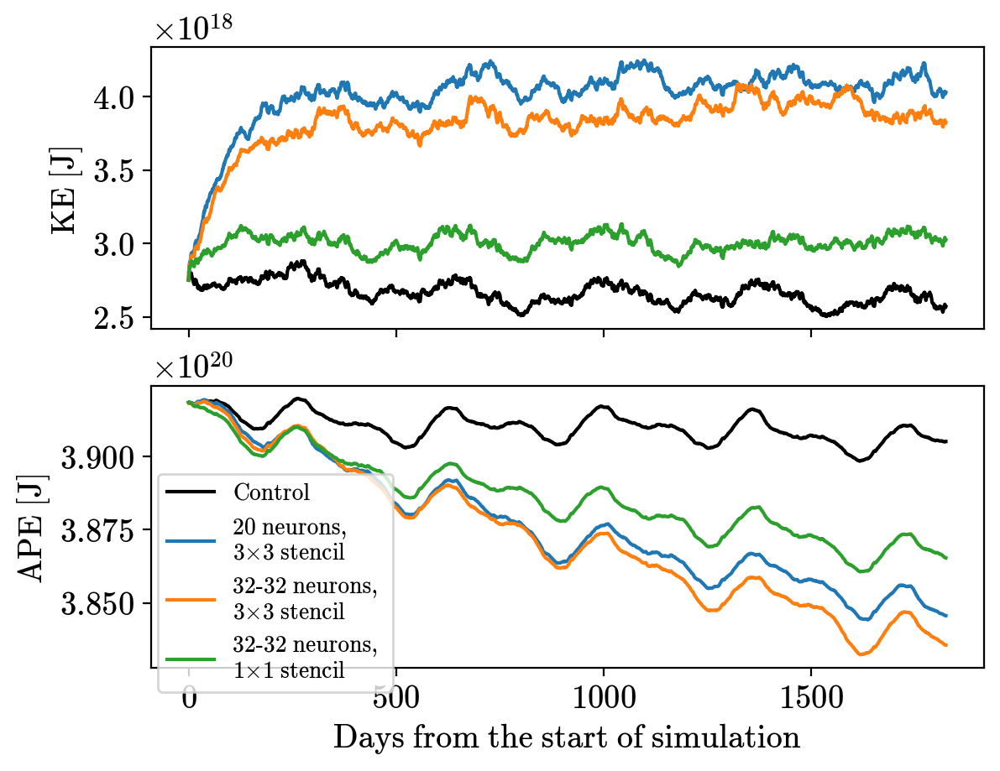

In [66]:
plt.figure(dpi=200)
plt.subplot(2,1,1)
time(control).KE.sum('Layer').plot(color='k', label='Control')
time(series_default).KE.sum('Layer').plot(label='20 neurons, \n3$\\times$3 stencil')
time(series_32_32).KE.sum('Layer').plot(label='32-32 neurons, \n3$\\times$3 stencil')
time(series_1x1).KE.sum('Layer').plot(label='32-32 neurons, \n1$\\times$1 stencil')
plt.xlabel('')
plt.xticks([0,500,1000,1500], []*4)
plt.ylabel('KE [J]')

plt.subplot(2,1,2)
time(control).APE.sum('Interface').plot(color='k', label='Control')
time(series_default).APE.sum('Interface').plot(label='20 neurons, \n3$\\times$3 stencil')
time(series_32_32).APE.sum('Interface').plot(label='32-32 neurons, \n3$\\times$3 stencil')
series_1x1.APE.sum('Interface').plot(label='32-32 neurons, \n1$\\times$1 stencil')
plt.ylabel('APE [J]')
plt.legend(bbox_to_anchor=(0.15,0.3), loc='center', fontsize=10)
plt.xlabel('Days from the start of simulation')

plt.savefig('figures/online-metrics-sensitivity.pdf')

## Plot multiple snapshots

In [3]:
skill = {}
# Both ANNs are trained on coarsegraining factor 9 and upper fluid layer (i.e., depth index is 0)
# The first ANN uses dimensional scaling, the second does not
for key in ['factor-9-depth-0']:
    skill[key] = read_skill(f'subfilter-large/FGR3/dimensional-scaling/32-32/{key}');

for key in ['dx-input-factor-9-depth-0', 'no-scaling-factor-9-depth-0']:
    skill[key] = read_skill(f'subfilter/FGR3/dimensional-scaling/32-32/{key}');

# Read grid information
training_data = read_datasets(['test'], factors=[4,9], subfilter='subfilter')
param_4 = training_data['test-4'].param
param_9 = training_data['test-9'].param

grid_4 = create_grid(param_4)
grid_9 = create_grid(param_9)

Reading from folder /vast/pp2681/CM26_datasets/ocean3d/subfilter/FGR3/factor-4
Reading from folder /vast/pp2681/CM26_datasets/ocean3d/subfilter/FGR3/factor-9


In [4]:
def SGSnorm(dataset, grid):
    return np.sqrt(grid.interp(dataset.SGSx,'X')**2 + grid.interp(dataset.SGSy,'Y')**2)

def ZBnorm(dataset, grid):
    return np.sqrt(grid.interp(dataset.ZB20u,'X')**2 + grid.interp(dataset.ZB20v,'Y')**2)

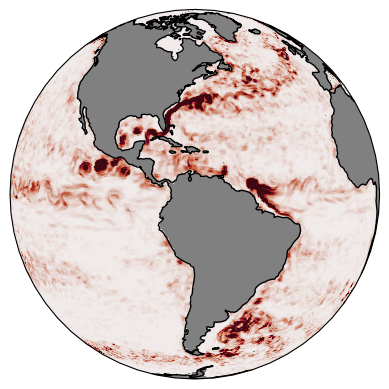

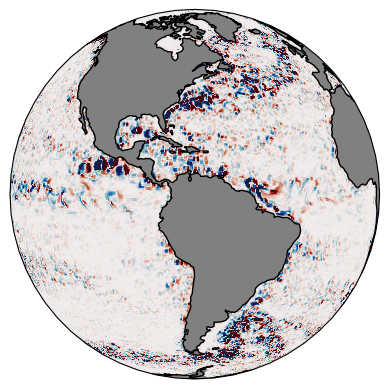

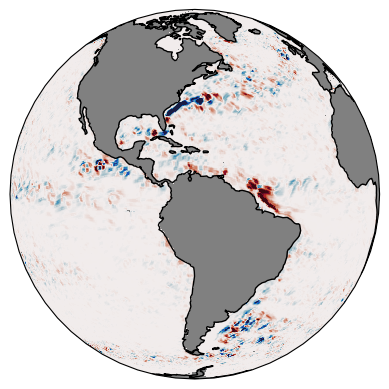

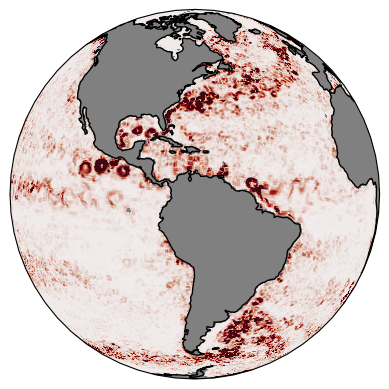

In [9]:
# Use red part of balance colorbar
cmap_red = cmocean.tools.crop_by_percent(cmocean.cm.balance, 50, which='min')
cmap_red.set_bad('gray')
from matplotlib.colors import LogNorm

def plot(array, param, ax=None, vmin=0., vmax=0.05, true_data=None, cmap=cmap_red, norm=None):
    if ax is None:
        ax = plt.subplot(1,1,1,projection = ccrs.Orthographic(central_latitude=5, central_longitude=-70))

    im = ax.pcolormesh(param.geolon_u, param.geolat_u, array, cmap=cmap, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree(), rasterized=True, norm=norm)
    ax.coastlines(rasterized=True);

    if true_data is not None:
        correlation = xr.corr(true_data, array)
        R2 = 1 - ((true_data-array)**2).mean() / true_data.var()
        text = 'R$^2$=%.2f\ncorr=%.2f' % (R2, correlation)
        ax.text(-71,-17, text, transform=ccrs.Geodetic(), color='white', fontsize=9)

    return im

# Check plotting function on one snapshot of diagnosed data
plt.figure()
plot(ann_default[4].SGS_KE[0], param_4)
plt.figure()
plot(ann_default[4].SGSx[0], param_4, vmin=-3e-7, vmax=3e-7, cmap=cmocean.cm.balance)
plt.figure()
plot(ann_default[4].Txy[0], param_4,vmin=-0.05, cmap=cmocean.cm.balance)
plt.figure()
plot(SGSnorm(ann_default[4], grid_4)[0], param_4, vmin=0, vmax=5e-7)

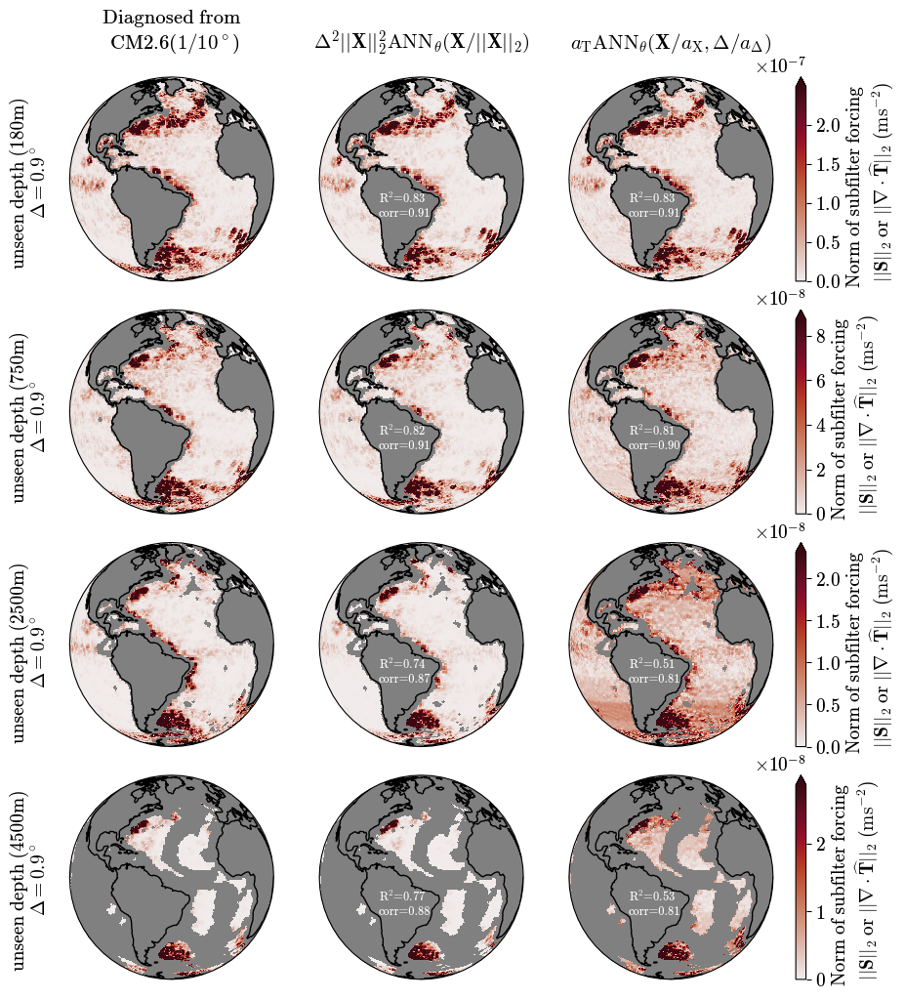

In [41]:
default_rcParams({'figure.subplot.wspace': 0.0, 'figure.subplot.hspace': 0.14, 'font.size':14})

cmap=cmocean.cm.balance
cmap.set_bad('gray')

fig, axes = plt.subplots(
    nrows=4, ncols=3,
    figsize=(12, 12),
    subplot_kw={'projection':ccrs.Orthographic(central_latitude=5, central_longitude=-45)}
)
axes = axes.flatten()

true_data = SGSnorm(skill['factor-9-depth-0'][9], grid_9)[3]
kw = dict(vmin=0, vmax=float(true_data.std()*2))
im_SGS_KE = plot(true_data, param_9, ax=axes[0], **kw)
axes[0].set_title('Diagnosed from\n CM2.6($1/10^\circ$)', y=1.1, fontsize=15)

data = ZBnorm(skill['factor-9-depth-0'][9], grid_9)[3]
plot(data, param_9,ax=axes[1], true_data=true_data, **kw)
axes[1].set_title('$\\Delta^2 ||\\mathbf{X}||_2^2 \\mathrm{ANN}_{\\theta} (\\mathbf{X} / ||\\mathbf{X}||_2)$', y=1.1, fontsize=15)

data = ZBnorm(skill['dx-input-factor-9-depth-0'][9], grid_9)[3]
plot(data, param_9,ax=axes[2], true_data=true_data, **kw)
axes[2].set_title('$a_{\mathrm{T}}\\mathrm{ANN}_{\\theta} (\\mathbf{X} / a_{\mathrm{X}}, \Delta/a_{\Delta})$', y=1.1, fontsize=15)

cbar = plt.colorbar(im_SGS_KE, ax=axes[0:3], shrink=1, extend='max', pad=0.025, aspect=20, 
             label='Norm of subfilter forcing \n $||\mathbf{S}||_2$ or $||\\nabla\\cdot\\widehat{\\mathbf{T}}||_2$ ($\mathrm{m}\mathrm{s}^{-2}$)')


true_data = SGSnorm(skill['factor-9-depth-0'][9], grid_9)[-5]
kw = dict(vmin=0, vmax=float(true_data.std()*2))
im_SGS_KE = plot(true_data, param_9, ax=axes[3], **kw)

data = ZBnorm(skill['factor-9-depth-0'][9], grid_9)[-5]
plot(data, param_9,ax=axes[4], true_data=true_data, **kw)

data = ZBnorm(skill['dx-input-factor-9-depth-0'][9], grid_9)[-5]
plot(data, param_9,ax=axes[5], true_data=true_data, **kw)

cbar = plt.colorbar(im_SGS_KE, ax=axes[3:6], shrink=1, extend='max', pad=0.025, aspect=20, 
             label='Norm of subfilter forcing \n $||\mathbf{S}||_2$ or $||\\nabla\\cdot\\widehat{\\mathbf{T}}||_2$ ($\mathrm{m}\mathrm{s}^{-2}$)')

true_data = SGSnorm(skill['factor-9-depth-0'][9], grid_9)[-3]
kw = dict(vmin=0, vmax=float(true_data.std()*2))
im_SGS_KE = plot(true_data, param_9, ax=axes[6], **kw)

data = ZBnorm(skill['factor-9-depth-0'][9], grid_9)[-3]
plot(data, param_9,ax=axes[7], true_data=true_data, **kw)

data = ZBnorm(skill['dx-input-factor-9-depth-0'][9], grid_9)[-3]
plot(data, param_9,ax=axes[8], true_data=true_data, **kw)

cbar = plt.colorbar(im_SGS_KE, ax=axes[6:9], shrink=1, extend='max', pad=0.025, aspect=20, 
             label='Norm of subfilter forcing \n $||\mathbf{S}||_2$ or $||\\nabla\\cdot\\widehat{\\mathbf{T}}||_2$ ($\mathrm{m}\mathrm{s}^{-2}$)')

true_data = SGSnorm(skill['factor-9-depth-0'][9], grid_9)[-1]
kw = dict(vmin=0, vmax=float(true_data.std()*2))
im_SGS_KE = plot(true_data, param_9, ax=axes[9], **kw)

data = ZBnorm(skill['factor-9-depth-0'][9], grid_9)[-1]
plot(data, param_9,ax=axes[10], true_data=true_data, **kw)

data = ZBnorm(skill['dx-input-factor-9-depth-0'][9], grid_9)[-1]
plot(data, param_9,ax=axes[11], true_data=true_data, **kw)

cbar = plt.colorbar(im_SGS_KE, ax=axes[9:12], shrink=1, extend='max', pad=0.025, aspect=20, 
             label='Norm of subfilter forcing \n $||\mathbf{S}||_2$ or $||\\nabla\\cdot\\widehat{\\mathbf{T}}||_2$ ($\mathrm{m}\mathrm{s}^{-2}$)')


fig.text(0.13,0.72, 'unseen depth (180m)\n$\\Delta=0.9^\\circ$', color='k', rotation=90, ha='center')
fig.text(0.13,0.52, 'unseen depth (750m)\n$\\Delta=0.9^\\circ$', color='k', rotation=90, ha='center')
fig.text(0.13,0.315, 'unseen depth (2500m)\n$\\Delta=0.9^\\circ$', color='k', rotation=90, ha='center')
fig.text(0.13,0.121, 'unseen depth (4500m)\n$\\Delta=0.9^\\circ$', color='k', rotation=90, ha='center')

plt.savefig('figures/SGS-norm-depth-dependent.pdf', dpi=200, transparent=True)

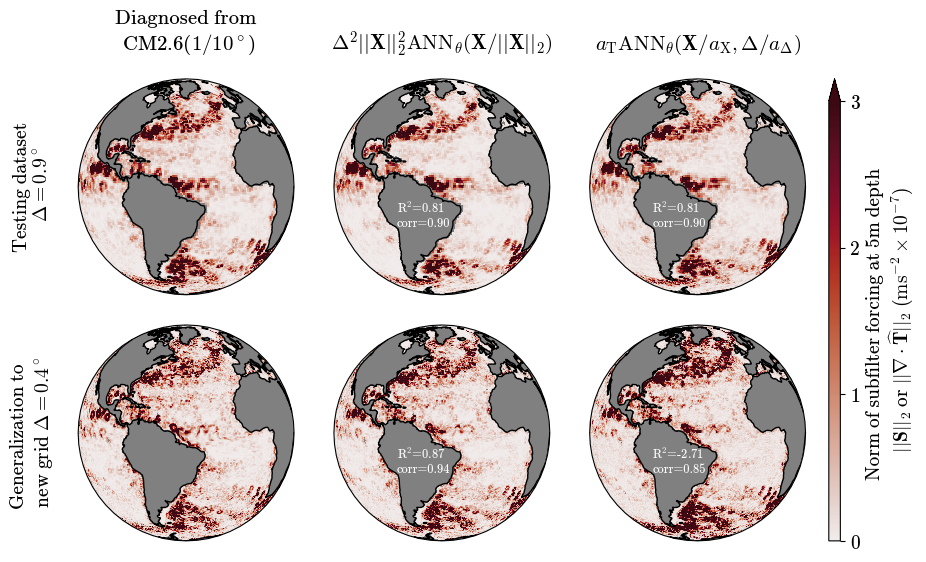

In [36]:
default_rcParams({'figure.subplot.wspace': 0.0, 'figure.subplot.hspace': 0.14, 'font.size':14})

cmap=cmocean.cm.balance
cmap.set_bad('gray')

fig, axes = plt.subplots(
    nrows=2, ncols=3,
    figsize=(12, 6),
    subplot_kw={'projection':ccrs.Orthographic(central_latitude=5, central_longitude=-45)}
)
axes = axes.flatten()
kw = dict(vmin=0, vmax=3e-7)

true_data = SGSnorm(skill['factor-9-depth-0'][9], grid_9)[0]
im_SGS_KE = plot(true_data, param_9, ax=axes[0], **kw)
axes[0].set_title('Diagnosed from\n CM2.6($1/10^\circ$)', y=1.1, fontsize=15)

data = ZBnorm(skill['factor-9-depth-0'][9], grid_9)[0]
plot(data, param_9,ax=axes[1], true_data=true_data, **kw)
axes[1].set_title('$\\Delta^2 ||\\mathbf{X}||_2^2 \\mathrm{ANN}_{\\theta} (\\mathbf{X} / ||\\mathbf{X}||_2)$', y=1.1, fontsize=15)

data = ZBnorm(skill['dx-input-factor-9-depth-0'][9], grid_9)[0]
plot(data, param_9,ax=axes[2], true_data=true_data, **kw)
axes[2].set_title('$a_{\mathrm{T}}\\mathrm{ANN}_{\\theta} (\\mathbf{X} / a_{\mathrm{X}}, \Delta/a_{\Delta})$', y=1.1, fontsize=15)

true_data = SGSnorm(skill['factor-9-depth-0'][4], grid_4)[0]
im_SGS_KE = plot(true_data, param_4, ax=axes[3], **kw)

data = ZBnorm(skill['factor-9-depth-0'][4], grid_4)[0]
plot(data, param_4,ax=axes[4], true_data=true_data, **kw)

data = ZBnorm(skill['dx-input-factor-9-depth-0'][4], grid_4)[0]
plot(data, param_4,ax=axes[5], true_data=true_data, **kw)

cbar = plt.colorbar(im_SGS_KE, ax=axes[0:6], shrink=1, extend='max', pad=0.025, aspect=40, 
             label='Norm of subfilter forcing at 5m depth \n $||\mathbf{S}||_2$ or $||\\nabla\\cdot\\widehat{\\mathbf{T}}||_2$ ($\mathrm{m}\mathrm{s}^{-2} \\times 10^{-7}$)')
cbar.set_ticks(np.arange(4) * 1e-7)
cbar.set_ticklabels(np.arange(4))

fig.text(0.12,0.6, 'Testing dataset\n $\\Delta=0.9^\circ$', color='k', rotation=90, ha='center')
fig.text(0.12,0.17, 'Generalization to \n new grid $\\Delta=0.4^\circ$', color='k', rotation=90, ha='center')

plt.savefig('figures/SGS-norm-snapshot.pdf', dpi=200, transparent=True)

In [13]:
import cmocean
import matplotlib.patches as patches
def plot_metric(exp=None, metric='R2_away',vmin=-1,vmax=1,cmap=cmocean.cm.balance,err_format="%.2f", show_numbers=True, title=False, xlabel=False, ylabel=False, add_yellow_rectangle=True, add_orange_rectangle=True, add_cyan_rectangle=True):
    data = xr.concat([exp[factor][metric] for factor in [4,9,12,15]], dim='factor')
    im = data.drop_vars(['zl']).plot(x='factor', y='zl',cmap=cmap, vmin=vmin, vmax=vmax, add_colorbar=False)

    if show_numbers:
    # Add text annotations
        for i in range(data.shape[0]):
            for j in range(data.shape[1]):
                plt.text(i, j, err_format % float(data[i,j]),
                        ha='center', va='center', color='white', fontsize=10)

    if add_yellow_rectangle:
        rectangle = patches.Rectangle(
                                        (1 - 0.45, 0 - 0.45),  # Lower-left corner of the rectangle
                                        0.9,  # Width (1 cell)
                                        0.9,  # Height (1 cell)
                                        linewidth=2,  # Border thickness
                                        edgecolor='y',  # Border color
                                        facecolor='none',  # No fill color
                                    )
        plt.gca().add_patch(rectangle)
    if add_orange_rectangle:
        rectangle = patches.Rectangle(
                                        (0 - 0.45, 0 - 0.45),  # Lower-left corner of the rectangle
                                        0.9,  # Width (1 cell)
                                        0.9,  # Height (1 cell)
                                        linewidth=2,  # Border thickness
                                        edgecolor='tab:orange',  # Border color
                                        facecolor='none',  # No fill color
                                    )
        plt.gca().add_patch(rectangle)

    if add_cyan_rectangle:
        rectangle = patches.Rectangle(
                                        (1 - 0.45, 7 - 0.45),  # Lower-left corner of the rectangle
                                        0.9,  # Width (1 cell)
                                        0.9,  # Height (1 cell)
                                        linewidth=2,  # Border thickness
                                        edgecolor='c',  # Border color
                                        facecolor='none',  # No fill color
                                    )
        plt.gca().add_patch(rectangle)
        
    
    if ylabel:
        plt.yticks(np.arange(10),[5, 55, 110, 180,330, 730,1500,2500,3500,4500]);
        plt.ylabel('Depth [m]')
    else:
        plt.yticks(np.arange(10),['']*10);
        plt.ylabel('')
    
    if xlabel:
        plt.xticks(np.arange(4),['$0.4^\circ$','$0.9^\circ$','$1.2^\circ$','$1.5^\circ$']);
        plt.xlabel('Coarse-grid spacing, $\Delta$')
    else:
        plt.xticks(np.arange(4), ['']*4)
        plt.xlabel('')
        
    if metric == 'R2':
        title_str = '$R^2$'
    elif metric == 'corr':
        title_str = 'Correlation'
    elif metric == 'opt_scaling':
        title_str = 'Optimal scaling'
    
    mean_val = float(data.mean())
    min_val = float(data.min())
    max_val = float(data.max())
    
    if title:
        plt.title(metric+f' = ${err_format}$ $({err_format}-{err_format})$' % (mean_val,min_val,max_val), fontsize=12)
    else:
        plt.title('')
    
    plt.gca().invert_yaxis()
    return im

# 32-32 ANNs

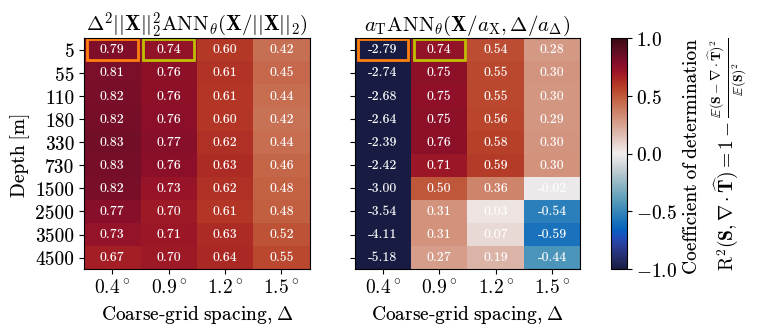

In [40]:
default_rcParams({'figure.subplot.wspace': 0.2, 'figure.subplot.hspace': 0.2, 'font.size':14})
fig = plt.figure(figsize=(8,3))

plt.subplot(1,2,1)
plot_metric(skill['factor-9-depth-0'], 'R2_away', ylabel=True, xlabel=True, add_cyan_rectangle=False);
plt.title('$\\Delta^2 ||\\mathbf{X}||_2^2 \\mathrm{ANN}_{\\theta} (\\mathbf{X} / ||\\mathbf{X}||_2)$', fontsize=15)
plt.subplot(1,2,2)
im_R2 = plot_metric(skill['dx-input-factor-9-depth-0'], 'R2_away', xlabel=True, add_cyan_rectangle=False);
plt.title('$a_{\mathrm{T}}\\mathrm{ANN}_{\\theta} (\\mathbf{X} / a_{\mathrm{X}}, \Delta/a_{\Delta})$', fontsize=15)

axes = plt.gcf().axes
plt.colorbar(im_R2, ax=axes[0:2], 
             label='Coefficient of determination \n$\mathrm{R}^2(\\mathbf{S},\\nabla\\cdot\\widehat{\\mathbf{T}})=1-\\frac{\\mathbb{E}(\\mathbf{S}-\\nabla\\cdot\\widehat{\\mathbf{T}})^2}{\\mathbb{E}(\mathbf{S})^2}$', aspect=15)

plt.savefig('figures/offline-metrics-S.pdf', dpi=200)

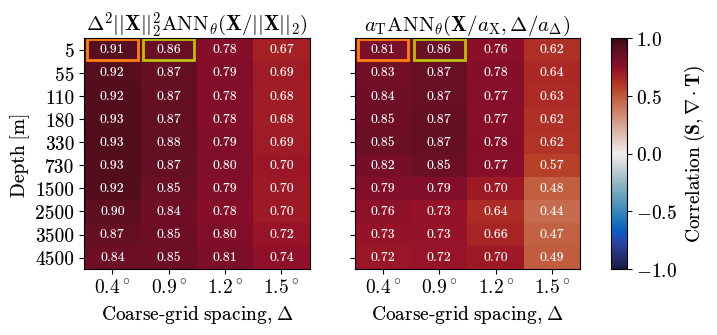

In [68]:
default_rcParams({'figure.subplot.wspace': 0.2, 'figure.subplot.hspace': 0.2, 'font.size':14})
fig = plt.figure(figsize=(8,3))

plt.subplot(1,2,1)
plot_metric(skill['factor-9-depth-0'], 'corr_away', ylabel=True, xlabel=True);
plt.title('$\\Delta^2 ||\\mathbf{X}||_2^2 \\mathrm{ANN}_{\\theta} (\\mathbf{X} / ||\\mathbf{X}||_2)$', fontsize=15)
plt.subplot(1,2,2)
im_R2 = plot_metric(skill['dx-input-factor-9-depth-0'], 'corr_away', xlabel=True);
plt.title('$a_{\mathrm{T}}\\mathrm{ANN}_{\\theta} (\\mathbf{X} / a_{\mathrm{X}}, \Delta/a_{\Delta})$', fontsize=15)

axes = plt.gcf().axes
plt.colorbar(im_R2, ax=axes[0:2], 
             label='Correlation ($\mathbf{S}, \\nabla \\cdot \mathbf{T}$)', aspect=15)


# Sensitivity to the random seed

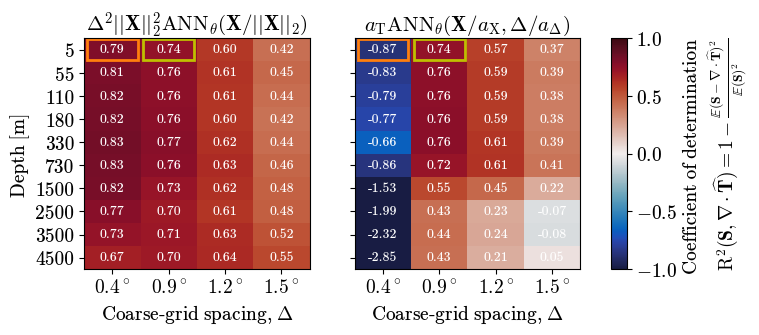

In [31]:
default_rcParams({'figure.subplot.wspace': 0.2, 'figure.subplot.hspace': 0.2, 'font.size':14})
fig = plt.figure(figsize=(8,3))

plt.subplot(1,2,1)
plot_metric(skill['factor-9-depth-0'], 'R2_away', ylabel=True, xlabel=True);
plt.title('$\\Delta^2 ||\\mathbf{X}||_2^2 \\mathrm{ANN}_{\\theta} (\\mathbf{X} / ||\\mathbf{X}||_2)$', fontsize=15)
plt.subplot(1,2,2)
im_R2 = plot_metric(skill['dx-input-factor-9-depth-0-seed1'], 'R2_away', xlabel=True);
plt.title('$a_{\mathrm{T}}\\mathrm{ANN}_{\\theta} (\\mathbf{X} / a_{\mathrm{X}}, \Delta/a_{\Delta})$', fontsize=15)

axes = plt.gcf().axes
plt.colorbar(im_R2, ax=axes[0:2], 
             label='Coefficient of determination \n$\mathrm{R}^2(\\mathbf{S},\\nabla\\cdot\\widehat{\\mathbf{T}})=1-\\frac{\\mathbb{E}(\\mathbf{S}-\\nabla\\cdot\\widehat{\\mathbf{T}})^2}{\\mathbb{E}(\mathbf{S})^2}$', aspect=15)

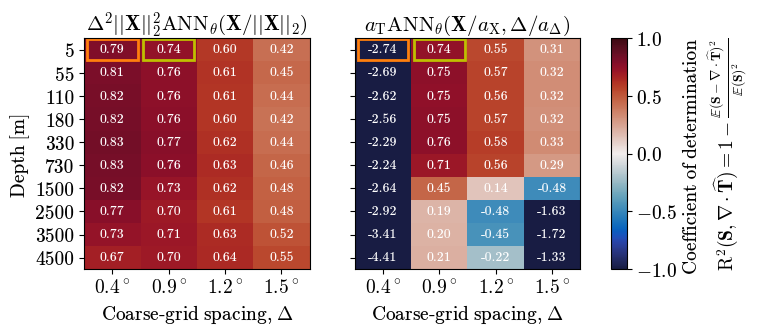

In [32]:
default_rcParams({'figure.subplot.wspace': 0.2, 'figure.subplot.hspace': 0.2, 'font.size':14})
fig = plt.figure(figsize=(8,3))

plt.subplot(1,2,1)
plot_metric(skill['factor-9-depth-0'], 'R2_away', ylabel=True, xlabel=True);
plt.title('$\\Delta^2 ||\\mathbf{X}||_2^2 \\mathrm{ANN}_{\\theta} (\\mathbf{X} / ||\\mathbf{X}||_2)$', fontsize=15)
plt.subplot(1,2,2)
im_R2 = plot_metric(skill['dx-input-factor-9-depth-0-seed2'], 'R2_away', xlabel=True);
plt.title('$a_{\mathrm{T}}\\mathrm{ANN}_{\\theta} (\\mathbf{X} / a_{\mathrm{X}}, \Delta/a_{\Delta})$', fontsize=15)

axes = plt.gcf().axes
plt.colorbar(im_R2, ax=axes[0:2], 
             label='Coefficient of determination \n$\mathrm{R}^2(\\mathbf{S},\\nabla\\cdot\\widehat{\\mathbf{T}})=1-\\frac{\\mathbb{E}(\\mathbf{S}-\\nabla\\cdot\\widehat{\\mathbf{T}})^2}{\\mathbb{E}(\mathbf{S})^2}$', aspect=15)

# Comparison to ANN used in online simulations

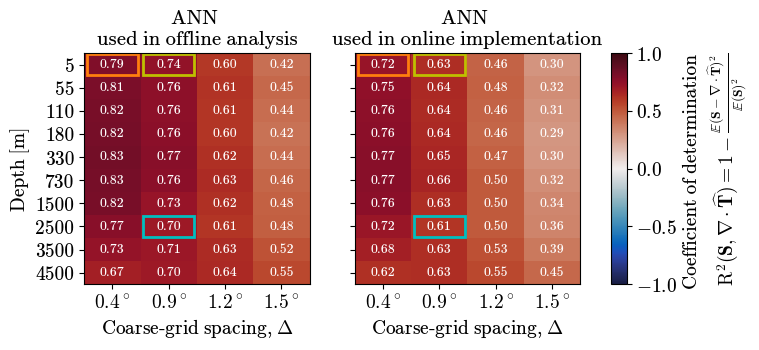

In [8]:
default_rcParams({'figure.subplot.wspace': 0.2, 'figure.subplot.hspace': 0.2, 'font.size':14})
fig = plt.figure(figsize=(8,3))

plt.subplot(1,2,1)
plot_metric(skill['factor-9-depth-0'], 'R2_away', ylabel=True, xlabel=True);
plt.title('ANN \nused in offline analysis', fontsize=15)
plt.subplot(1,2,2)
im_R2 = plot_metric(ann_default, 'R2_away', xlabel=True);
plt.title('ANN \nused in online implementation', fontsize=15)

axes = plt.gcf().axes
plt.colorbar(im_R2, ax=axes[0:2], 
             label='Coefficient of determination \n$\mathrm{R}^2(\\mathbf{S},\\nabla\\cdot\\widehat{\\mathbf{T}})=1-\\frac{\\mathbb{E}(\\mathbf{S}-\\nabla\\cdot\\widehat{\\mathbf{T}})^2}{\\mathbb{E}(\mathbf{S})^2}$', aspect=15)

In [19]:
for factor in [4,9,12,15]:
    print(skill['factor-9-depth-0'][factor].R2_away.mean().compute().data - ann_default[factor].R2_away.mean().compute().data)

0.05875101016377082
0.1037961283861446
0.1274306995099876
0.12520061532048826


In [20]:
np.mean([0.05875101016377082,
0.1037961283861446,
0.1274306995099876,
0.12520061532048826])

0.10379461334509782

# Sensitivity to the number of neurons in ANNs

In [39]:
skill_20 = {}
# Both ANNs are trained on coarsegraining factor 9 and upper fluid layer (i.e., depth index is 0)
# The first ANN uses dimensional scaling, the second does not
for key in ['factor-9-depth-0']:
    skill_20[key] = read_skill(f'subfilter-large/FGR3/dimensional-scaling/20/{key}');

for key in ['dx-input-factor-9-depth-0', 'no-scaling-factor-9-depth-0']:
    skill_20[key] = read_skill(f'subfilter/FGR3/dimensional-scaling/20/{key}');

In [44]:
skill_64_64 = {}
for key in ['dx-input-factor-9-depth-0', 'factor-9-depth-0']:
    skill_64_64[key] = read_skill(f'subfilter/FGR3/dimensional-scaling/64-64/{key}');

In [88]:
skill_128_128_128 = {}
for key in ['dx-input-factor-9-depth-0', 'factor-9-depth-0']:
    skill_128_128_128[key] = read_skill(f'subfilter/FGR3/dimensional-scaling/128-128-128/{key}');

Text(0.5, 1.05, '20 neurons')

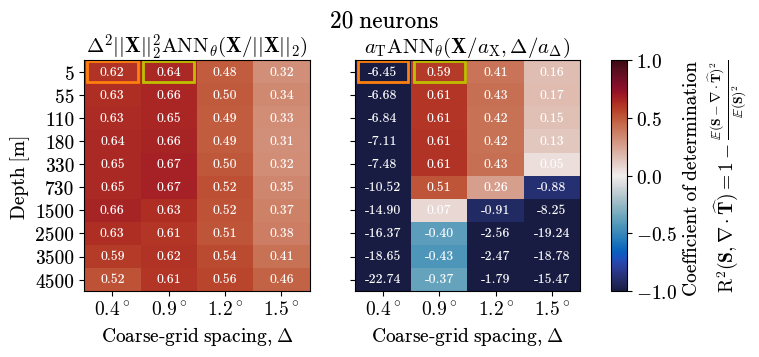

In [72]:
default_rcParams({'figure.subplot.wspace': 0.2, 'figure.subplot.hspace': 0.2, 'font.size':14})
fig = plt.figure(figsize=(8,3))

plt.subplot(1,2,1)
plot_metric(skill_20['factor-9-depth-0'], 'R2_away', ylabel=True, xlabel=True);
plt.title('$\\Delta^2 ||\\mathbf{X}||_2^2 \\mathrm{ANN}_{\\theta} (\\mathbf{X} / ||\\mathbf{X}||_2)$', fontsize=15)
plt.subplot(1,2,2)
im_R2 = plot_metric(skill_20['dx-input-factor-9-depth-0'], 'R2_away', xlabel=True);
plt.title('$a_{\mathrm{T}}\\mathrm{ANN}_{\\theta} (\\mathbf{X} / a_{\mathrm{X}}, \Delta/a_{\Delta})$', fontsize=15)

axes = plt.gcf().axes
plt.colorbar(im_R2, ax=axes[0:2], 
             label='Coefficient of determination \n$\mathrm{R}^2(\\mathbf{S},\\nabla\\cdot\\widehat{\\mathbf{T}})=1-\\frac{\\mathbb{E}(\\mathbf{S}-\\nabla\\cdot\\widehat{\\mathbf{T}})^2}{\\mathbb{E}(\mathbf{S})^2}$', aspect=15)

plt.suptitle('20 neurons', y=1.05)

Text(0.5, 1.05, '64-64 neurons')

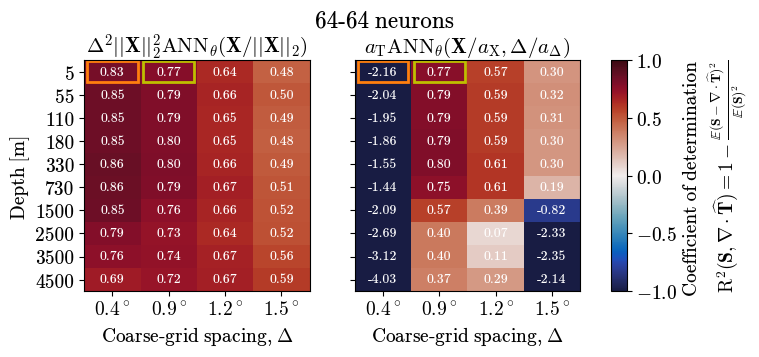

In [16]:
default_rcParams({'figure.subplot.wspace': 0.2, 'figure.subplot.hspace': 0.2, 'font.size':14})
fig = plt.figure(figsize=(8,3))

plt.subplot(1,2,1)
plot_metric(skill_64_64['factor-9-depth-0'], 'R2_away', ylabel=True, xlabel=True);
plt.title('$\\Delta^2 ||\\mathbf{X}||_2^2 \\mathrm{ANN}_{\\theta} (\\mathbf{X} / ||\\mathbf{X}||_2)$', fontsize=15)
plt.subplot(1,2,2)
im_R2 = plot_metric(skill_64_64['dx-input-factor-9-depth-0'], 'R2_away', xlabel=True);
plt.title('$a_{\mathrm{T}}\\mathrm{ANN}_{\\theta} (\\mathbf{X} / a_{\mathrm{X}}, \Delta/a_{\Delta})$', fontsize=15)

axes = plt.gcf().axes
plt.colorbar(im_R2, ax=axes[0:2], 
             label='Coefficient of determination \n$\mathrm{R}^2(\\mathbf{S},\\nabla\\cdot\\widehat{\\mathbf{T}})=1-\\frac{\\mathbb{E}(\\mathbf{S}-\\nabla\\cdot\\widehat{\\mathbf{T}})^2}{\\mathbb{E}(\mathbf{S})^2}$', aspect=15)

plt.suptitle('64-64 neurons', y=1.05)

Text(0.5, 1.05, '128-128-128 neurons')

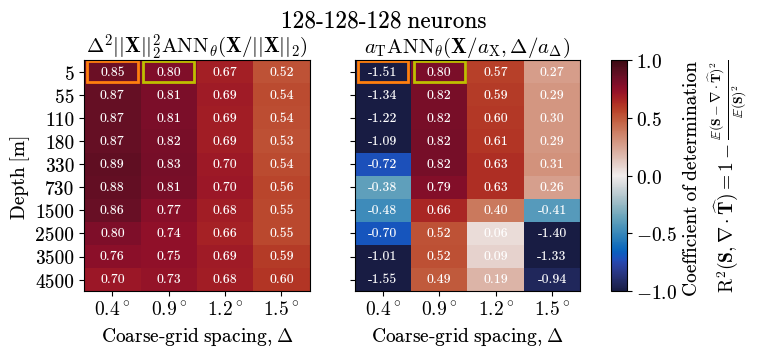

In [90]:
default_rcParams({'figure.subplot.wspace': 0.2, 'figure.subplot.hspace': 0.2, 'font.size':14})
fig = plt.figure(figsize=(8,3))

plt.subplot(1,2,1)
plot_metric(skill_128_128_128['factor-9-depth-0'], 'R2_away', ylabel=True, xlabel=True);
plt.title('$\\Delta^2 ||\\mathbf{X}||_2^2 \\mathrm{ANN}_{\\theta} (\\mathbf{X} / ||\\mathbf{X}||_2)$', fontsize=15)
plt.subplot(1,2,2)
im_R2 = plot_metric(skill_128_128_128['dx-input-factor-9-depth-0'], 'R2_away', xlabel=True);
plt.title('$a_{\mathrm{T}}\\mathrm{ANN}_{\\theta} (\\mathbf{X} / a_{\mathrm{X}}, \Delta/a_{\Delta})$', fontsize=15)

axes = plt.gcf().axes
plt.colorbar(im_R2, ax=axes[0:2], 
             label='Coefficient of determination \n$\mathrm{R}^2(\\mathbf{S},\\nabla\\cdot\\widehat{\\mathbf{T}})=1-\\frac{\\mathbb{E}(\\mathbf{S}-\\nabla\\cdot\\widehat{\\mathbf{T}})^2}{\\mathbb{E}(\mathbf{S})^2}$', aspect=15)

plt.suptitle('128-128-128 neurons', y=1.05)

Correlation: 0.6136542558670044
Relative Error: 5.16878080368042
R2 =  -3.588747024536133
R2 max =  0.26896172761917114
Optinal scaling: 0.2088898867368698
Nans [test/control]: [77177, 77177]


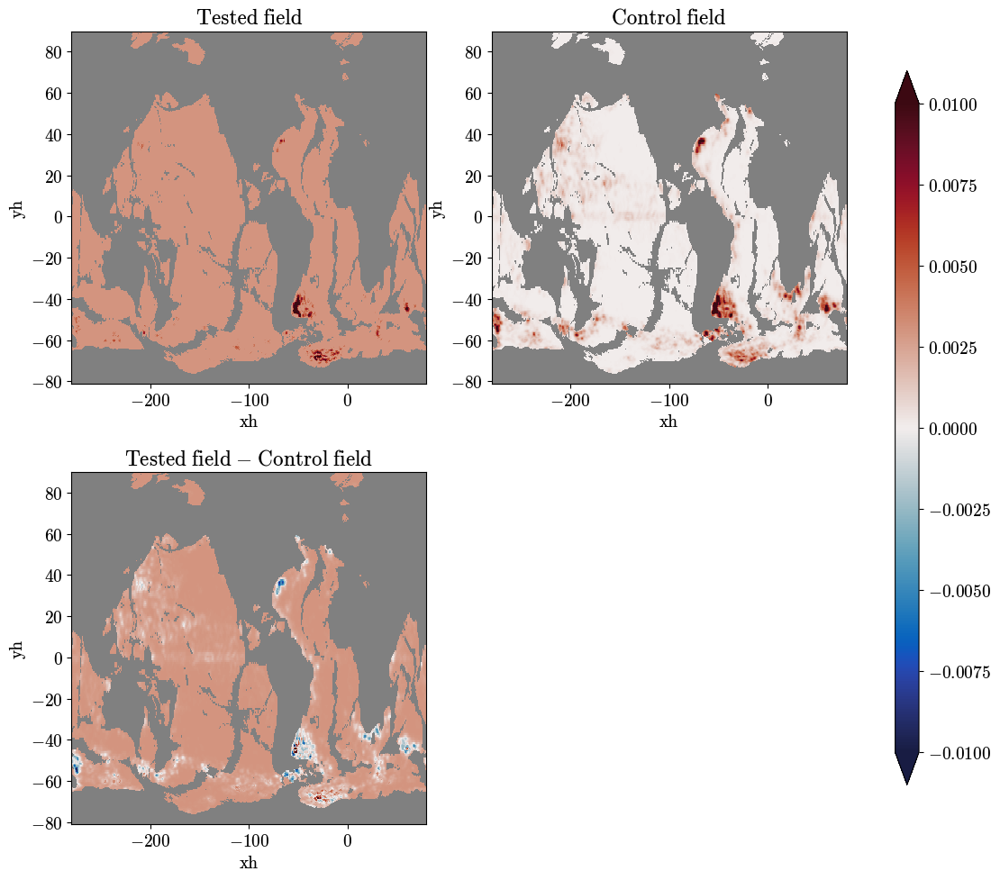

In [40]:
compare(skill_20['no-scaling-factor-9-depth-0'][9].SGS_KE_pred[-2], skill_20['factor-9-depth-0'][9].SGS_KE[-2], selector=select_globe, vmin=-0.01, vmax=0.01);

Correlation: 0.9323680400848389
Relative Error: 0.34668833017349243
R2 =  0.8884860873222351
R2 max =  0.8895096033811569
Optinal scaling: 1.0351125001907349
Nans [test/control]: [49785, 49785]


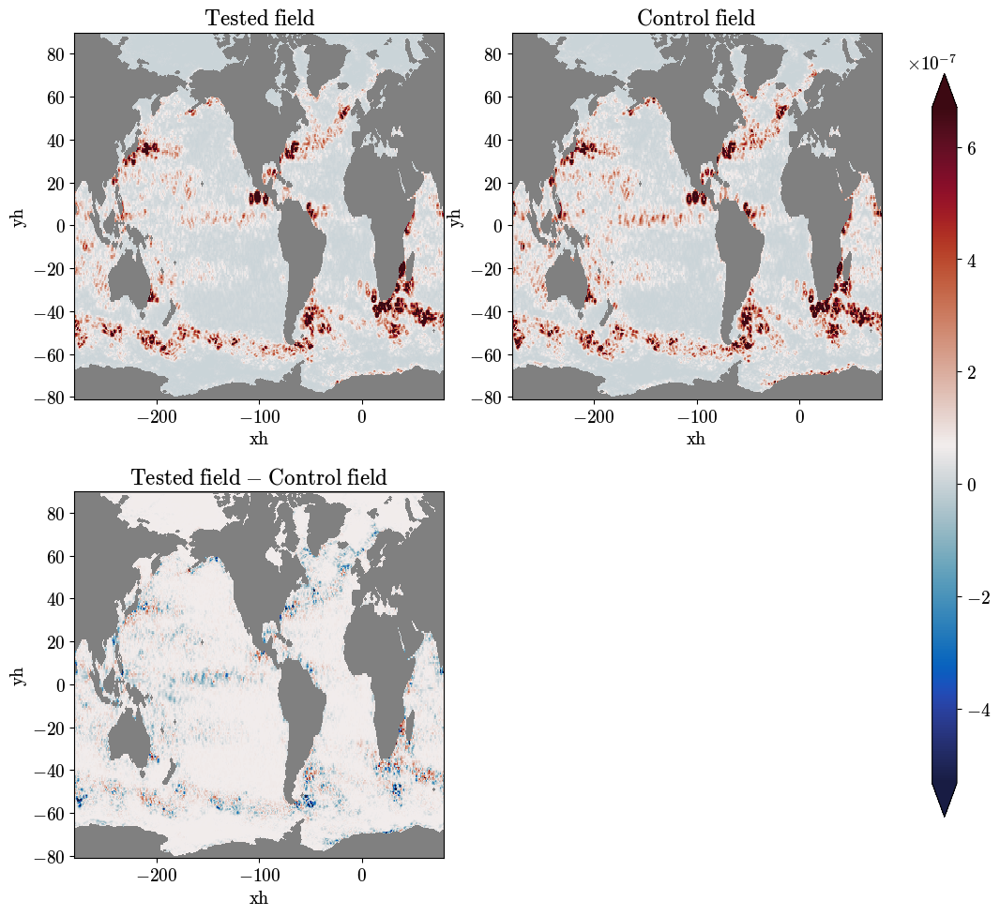

In [97]:
compare(ZBnorm(skill_128_128_128['dx-input-factor-9-depth-0'][9], grid_9)[0], SGSnorm(skill_20['factor-9-depth-0'][9], grid_9)[0], selector=select_globe);

Correlation: 0.8555514812469482
Relative Error: 0.9487505555152893
R2 =  0.7093212604522705
R2 max =  0.7543210983276367
Optinal scaling: 0.803699791431427
Nans [test/control]: [83169, 83169]


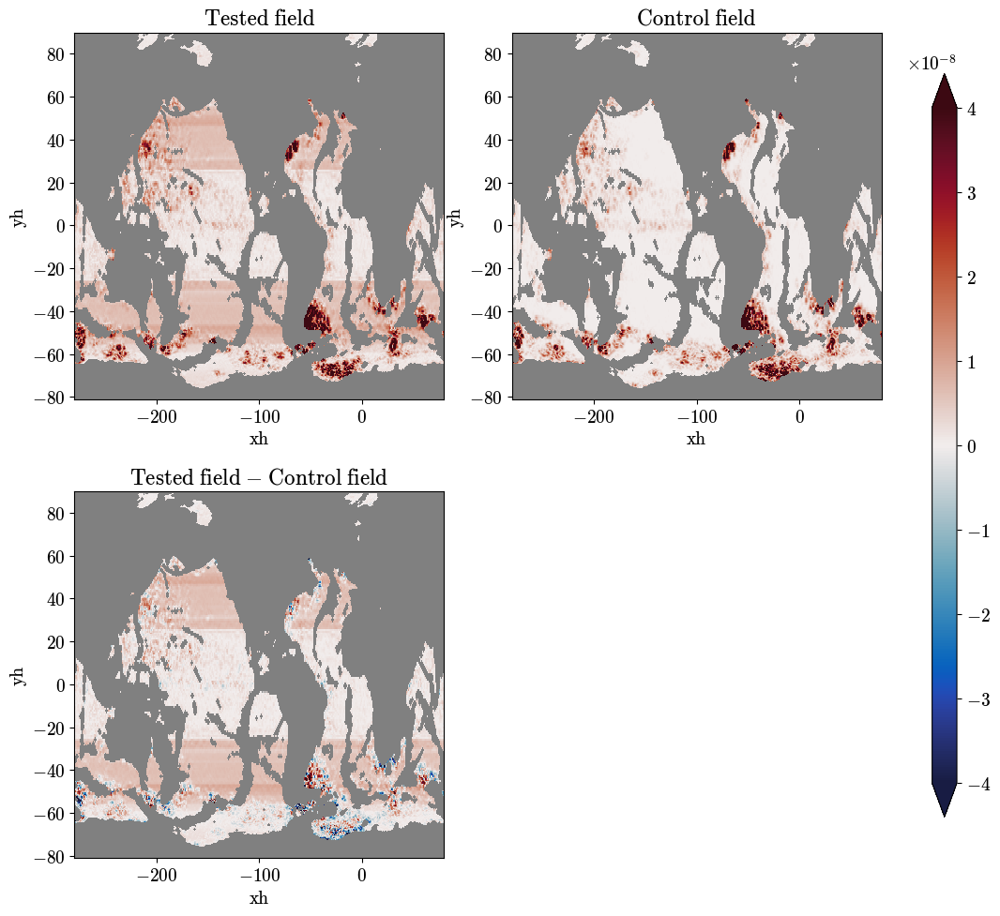

In [102]:
compare(ZBnorm(skill_128_128_128['dx-input-factor-9-depth-0'][9], grid_9)[-2], SGSnorm(skill_20['factor-9-depth-0'][9], grid_9)[-2], selector=select_globe, vmin=-4e-8, vmax=4e-8);

Correlation: 0.8011956810951233
Relative Error: 1.2246909141540527
R2 =  0.5635752975940704
R2 max =  0.668890118598938
Optinal scaling: 0.7159242033958435
Nans [test/control]: [83169, 83169]


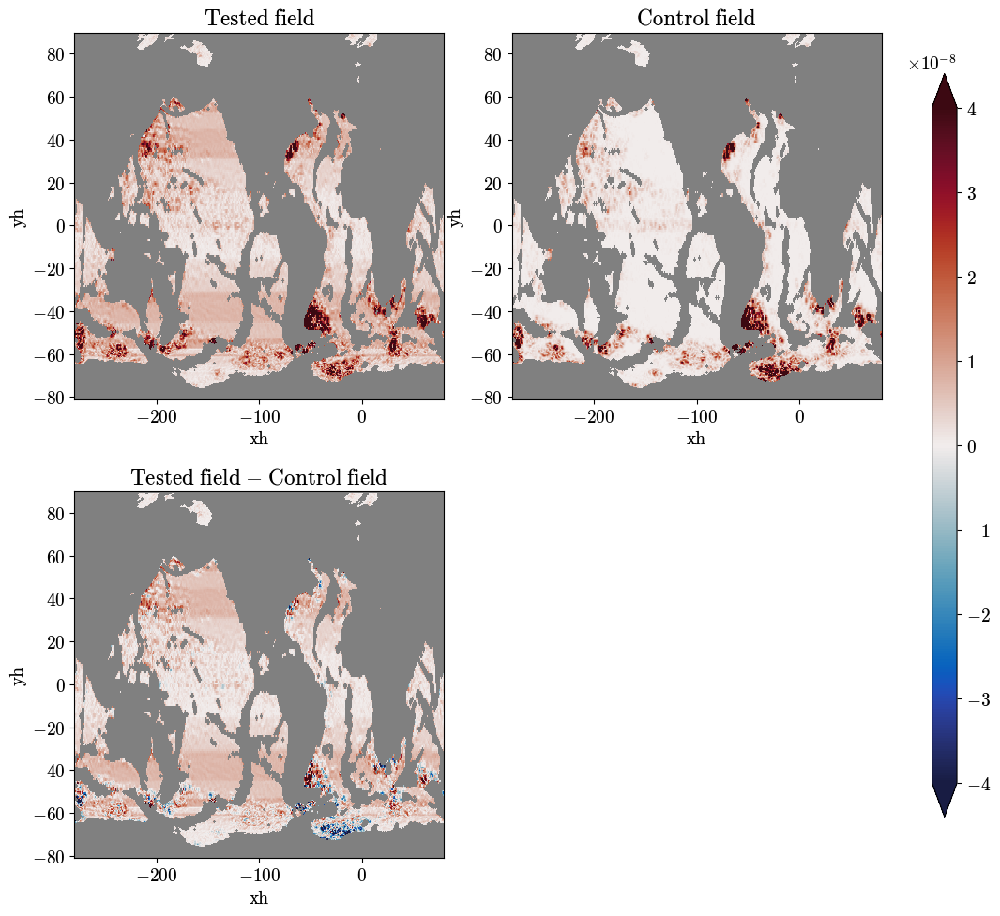

In [103]:
compare(ZBnorm(skill['dx-input-factor-9-depth-0'][9], grid_9)[-2], SGSnorm(skill_20['factor-9-depth-0'][9], grid_9)[-2], selector=select_globe, vmin=-4e-8, vmax=4e-8);

Correlation: 0.7886459827423096
Relative Error: 0.6534474492073059
R2 =  0.5197404325008392
R2 max =  0.659200131893158
Optinal scaling: 0.6849523782730103
Nans [test/control]: [83169, 83169]


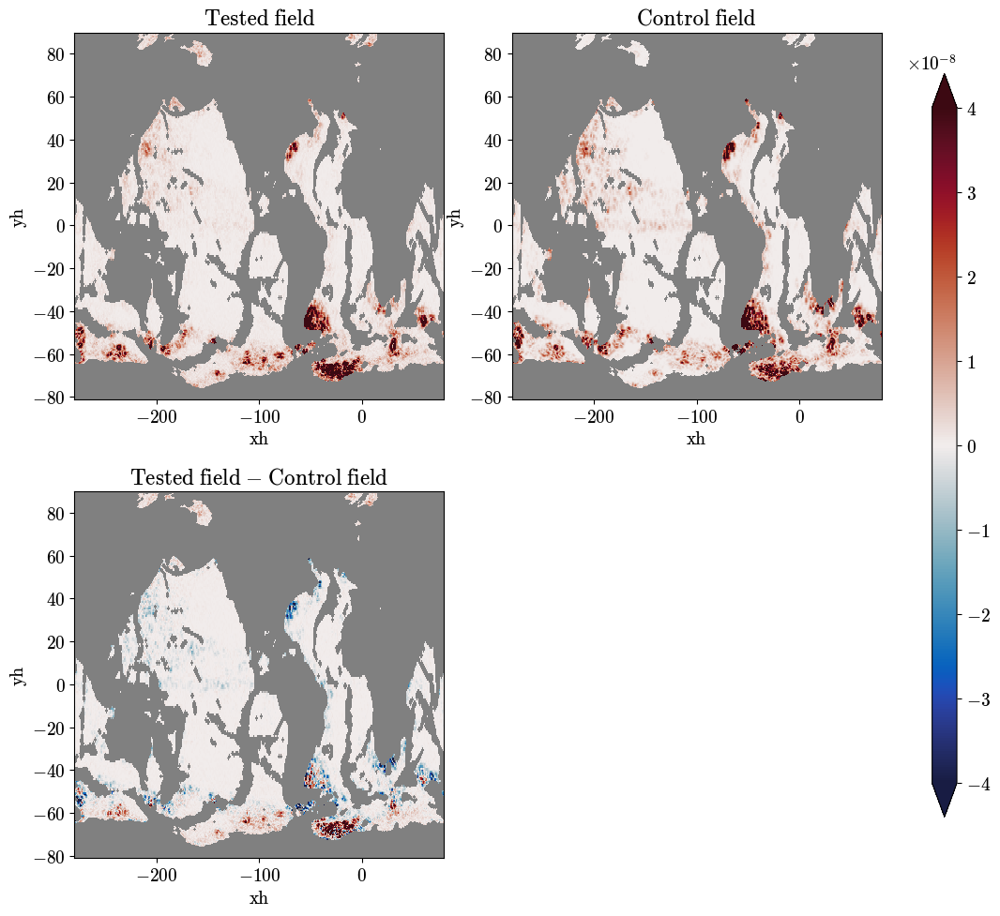

In [106]:
compare(ZBnorm(skill['no-scaling-factor-9-depth-0'][9], grid_9)[-2], SGSnorm(skill_20['factor-9-depth-0'][9], grid_9)[-2], selector=select_globe, vmin=-4e-8, vmax=4e-8);

# Subfilter models trained on fluxes but not divergences

In [46]:
skill_flux_20 = {}
for key in ['dx-input-factor-9-depth-0', 'factor-9-depth-0', 'no-scaling-factor-9-depth-0']:
    skill_flux_20[key] = read_skill(f'subfilter/FGR3/dimensional-scaling-fluxes/20/{key}');

In [47]:
skill_flux_32_32 = {}
for key in ['dx-input-factor-9-depth-0', 'factor-9-depth-0', 'no-scaling-factor-9-depth-0']:
    skill_flux_32_32[key] = read_skill(f'subfilter/FGR3/dimensional-scaling-fluxes/32-32/{key}');

In [48]:
skill_flux_64_64 = {}
for key in ['dx-input-factor-9-depth-0', 'factor-9-depth-0', 'no-scaling-factor-9-depth-0']:
    skill_flux_64_64[key] = read_skill(f'subfilter/FGR3/dimensional-scaling-fluxes/64-64/{key}');

Correlation: 0.8283286094665527
Relative Error: 1.3717137575149536
R2 =  -0.6751985549926758
R2 max =  0.726911723613739
Optinal scaling: 0.41861429810523987
Nans [test/control]: [77177, 77177]


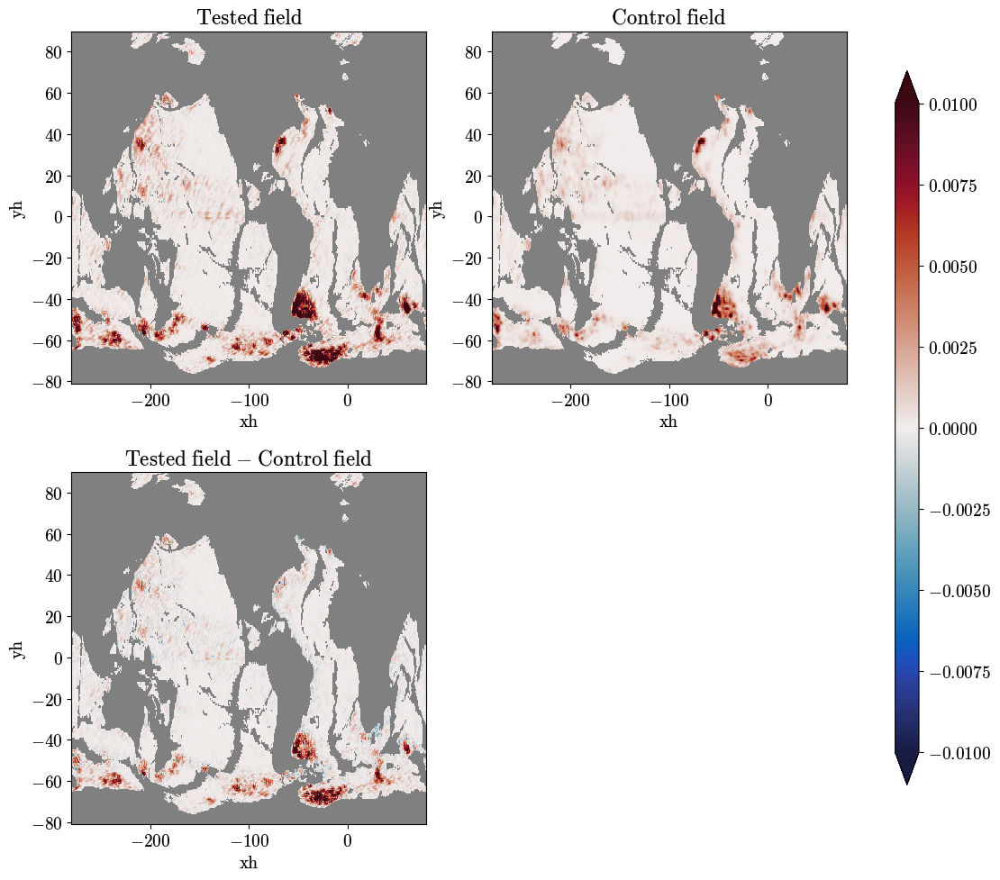

In [49]:
compare(skill_flux_20['no-scaling-factor-9-depth-0'][9].SGS_KE_pred[-2], skill_flux_20['factor-9-depth-0'][9].SGS_KE[-2], selector=select_globe, vmin=-0.01, vmax=0.01);

Correlation: 0.8570101857185364
Relative Error: 1.081520676612854
R2 =  -0.2142871618270874
R2 max =  0.7747910469770432
Optinal scaling: 0.4695153534412384
Nans [test/control]: [77177, 77177]


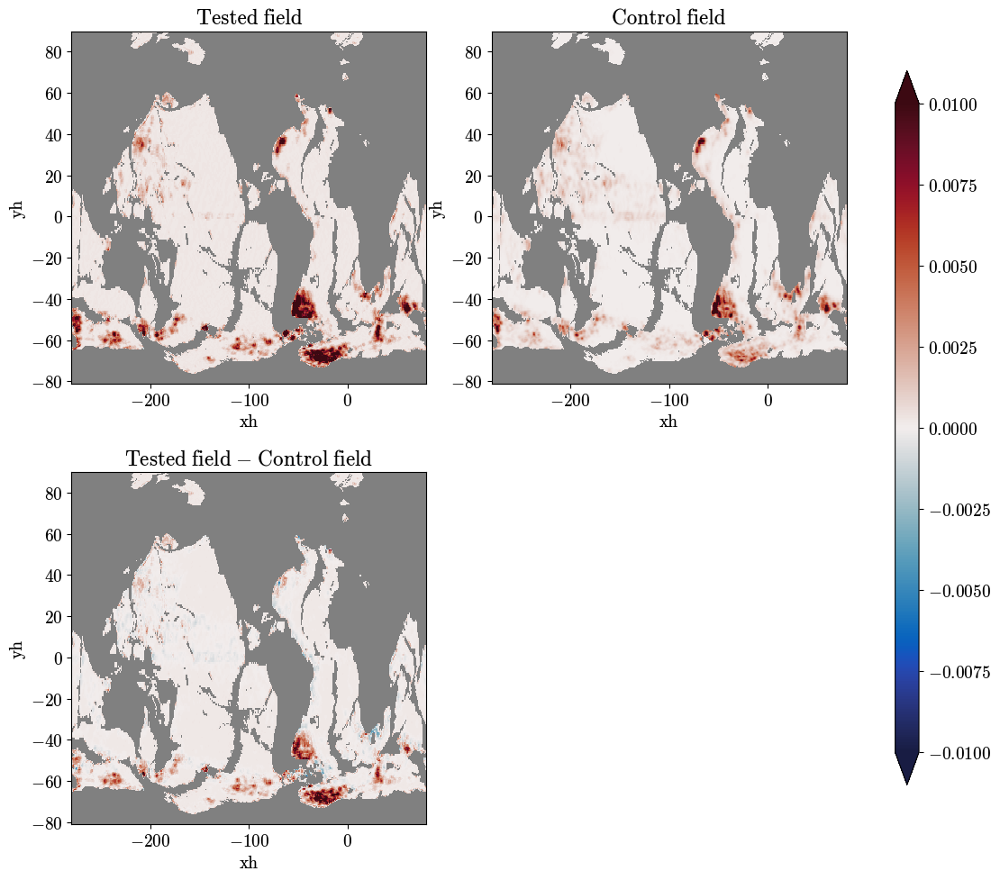

In [50]:
compare(skill_flux_32_32['no-scaling-factor-9-depth-0'][9].SGS_KE_pred[-2], skill_flux_20['factor-9-depth-0'][9].SGS_KE[-2], selector=select_globe, vmin=-0.01, vmax=0.01);

Correlation: 0.8631855249404907
Relative Error: 1.0835075378417969
R2 =  -0.16504371166229248
R2 max =  0.7817728072404861
Optinal scaling: 0.4760756194591522
Nans [test/control]: [77177, 77177]


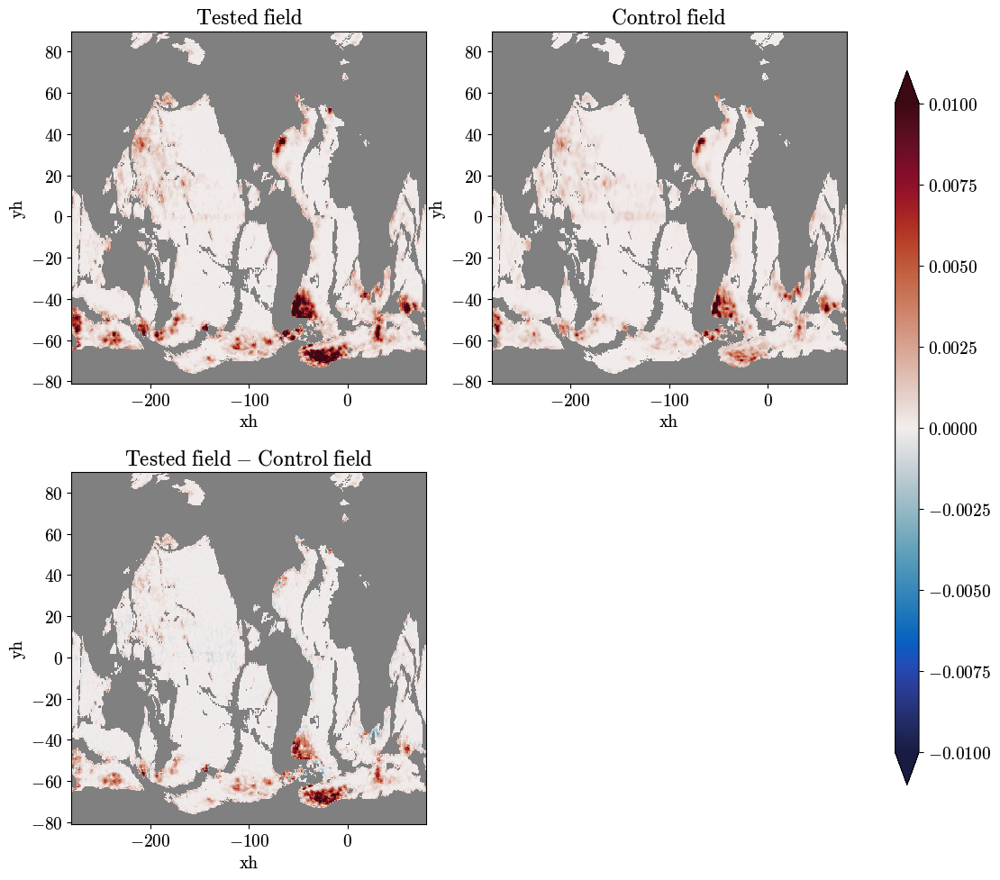

In [51]:
compare(skill_flux_64_64['no-scaling-factor-9-depth-0'][9].SGS_KE_pred[-2], skill_flux_20['factor-9-depth-0'][9].SGS_KE[-2], selector=select_globe, vmin=-0.01, vmax=0.01);

Correlation: 0.9120697975158691
Relative Error: 0.3981437385082245
R2 =  0.8648183345794678
R2 max =  0.8650712370872498
Optinal scaling: 0.9831897020339966
Nans [test/control]: [44658, 44658]


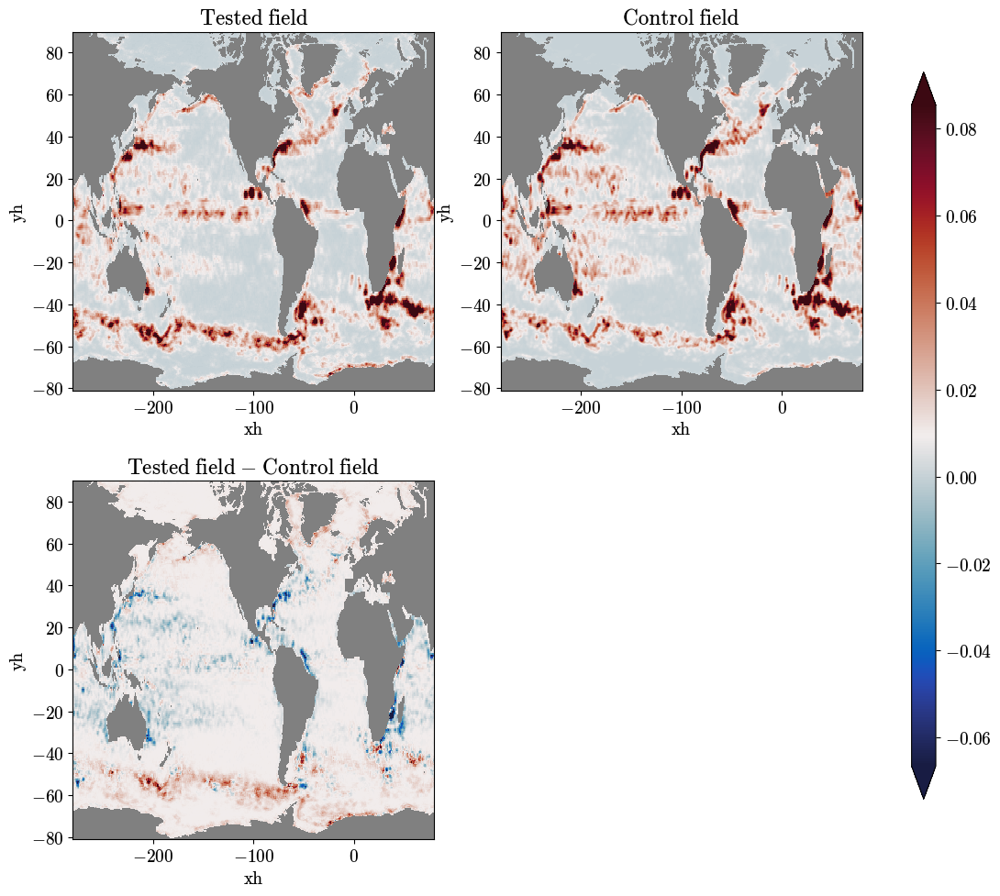

In [53]:
compare(skill_flux_64_64['no-scaling-factor-9-depth-0'][9].SGS_KE_pred[0], skill_flux_20['factor-9-depth-0'][9].SGS_KE[0], selector=select_globe);

Correlation: 0.9674356579780579
Relative Error: 0.23575042188167572
R2 =  0.9477746859192848
R2 max =  0.9485643319785595
Optinal scaling: 0.9719566702842712
Nans [test/control]: [44658, 44658]


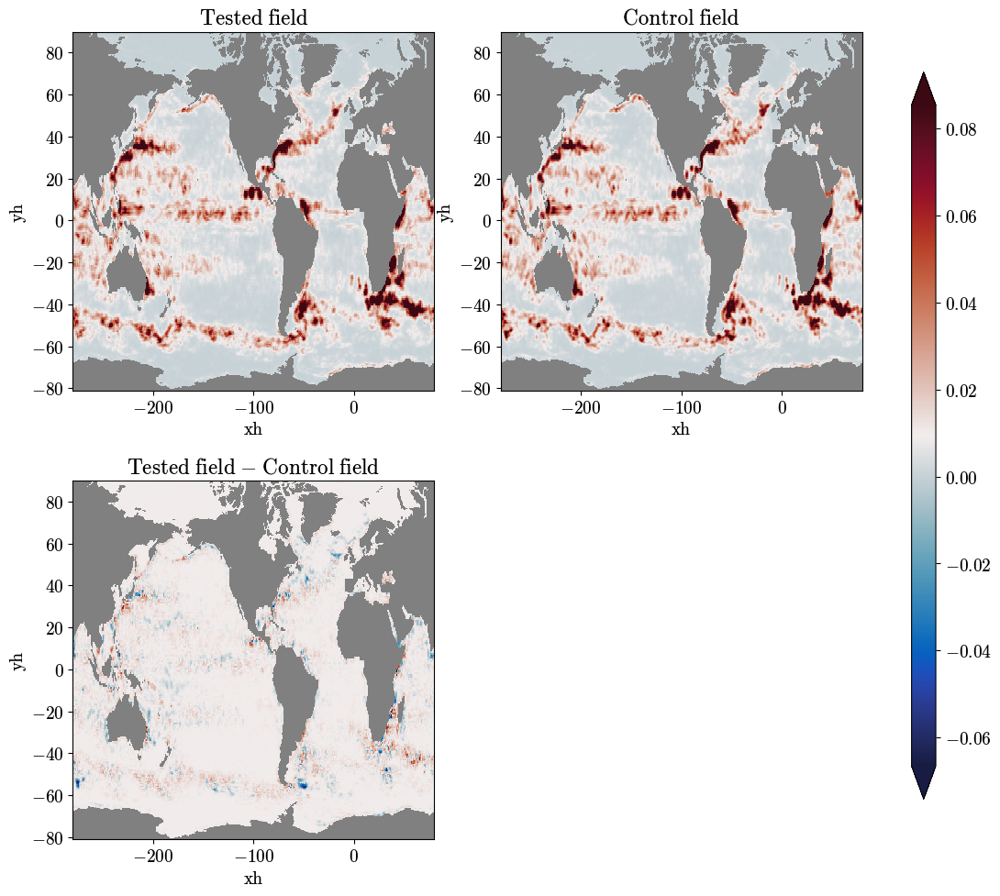

In [54]:
compare(skill_flux_64_64['dx-input-factor-9-depth-0'][9].SGS_KE_pred[0], skill_flux_20['factor-9-depth-0'][9].SGS_KE[0], selector=select_globe);

Correlation: 0.9581619501113892
Relative Error: 0.2531992793083191
R2 =  0.9298351034522057
R2 max =  0.9304376319050789
Optinal scaling: 0.9751836061477661
Nans [test/control]: [44658, 44658]


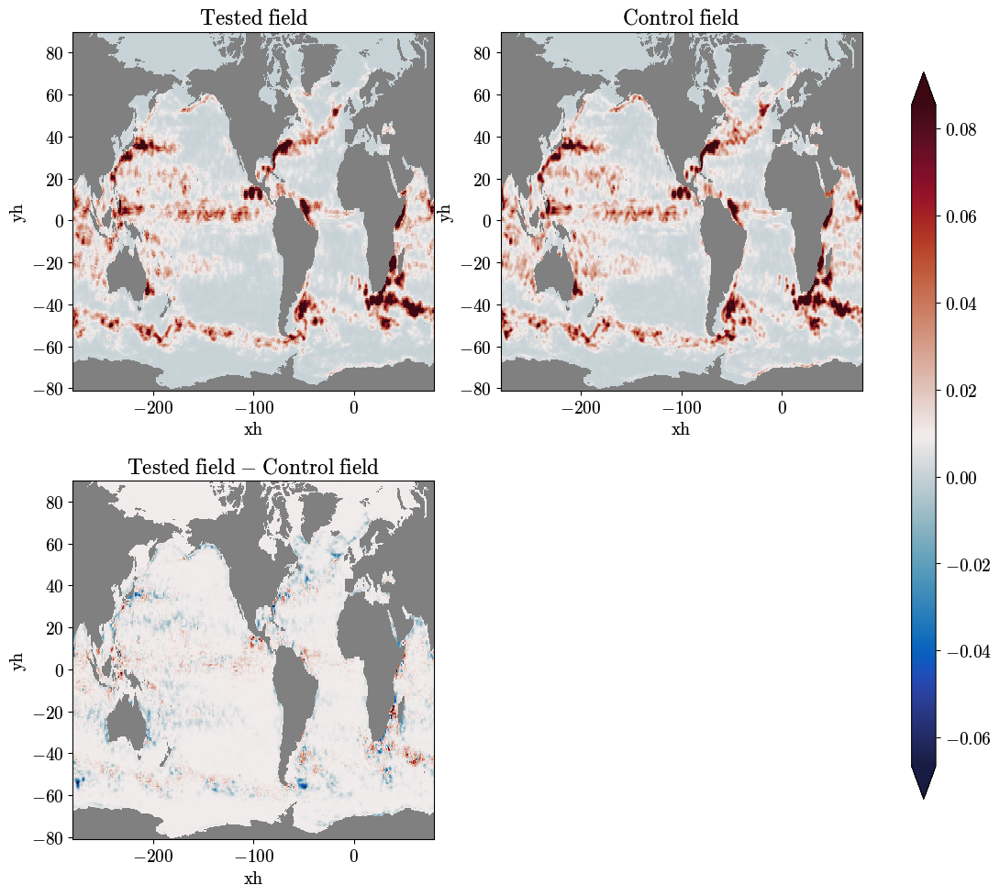

In [55]:
compare(skill_flux_64_64['factor-9-depth-0'][9].SGS_KE_pred[0], skill_flux_20['factor-9-depth-0'][9].SGS_KE[0], selector=select_globe);

Correlation: 0.8696646690368652
Relative Error: 0.9204562306404114
R2 =  0.5499033629894257
R2 max =  0.7917258590459824
Optinal scaling: 0.6440545320510864
Nans [test/control]: [77177, 77177]


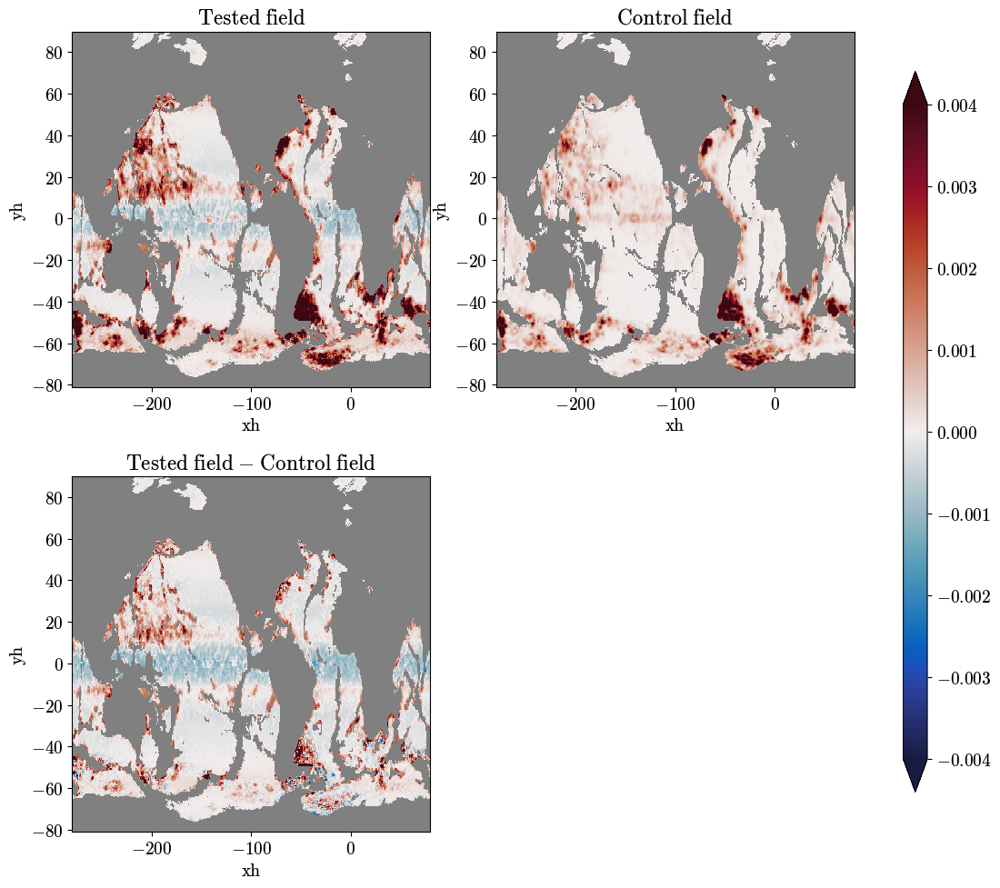

In [57]:
compare(skill_flux_64_64['dx-input-factor-9-depth-0'][9].SGS_KE_pred[-2], skill_flux_20['factor-9-depth-0'][9].SGS_KE[-2], selector=select_globe, vmin=-0.004, vmax=0.004);

Correlation: 0.9224126935005188
Relative Error: 0.3945261836051941
R2 =  0.8597585409879684
R2 max =  0.8598072975873947
Optinal scaling: 1.0075896978378296
Nans [test/control]: [77177, 77177]


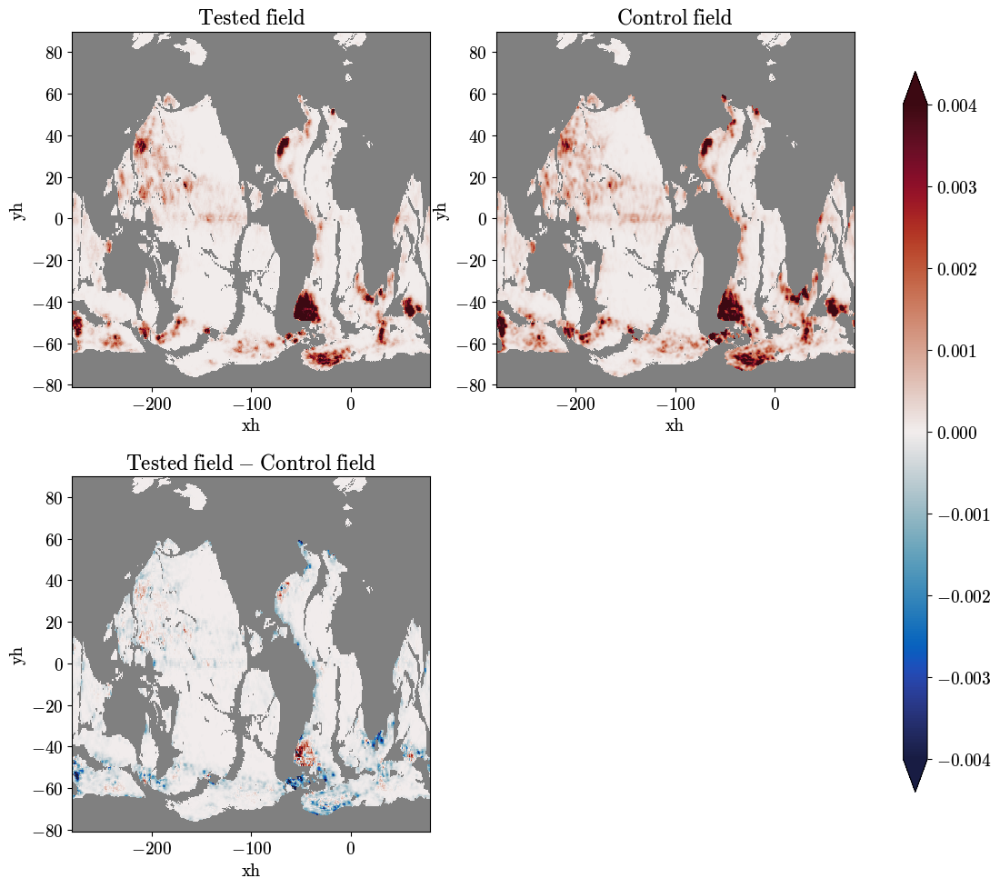

In [58]:
compare(skill_flux_64_64['factor-9-depth-0'][9].SGS_KE_pred[-2], skill_flux_20['factor-9-depth-0'][9].SGS_KE[-2], selector=select_globe, vmin=-0.004, vmax=0.004);

Correlation: 0.8631855249404907
Relative Error: 1.0835075378417969
R2 =  -0.16504371166229248
R2 max =  0.7817728072404861
Optinal scaling: 0.4760756194591522
Nans [test/control]: [77177, 77177]


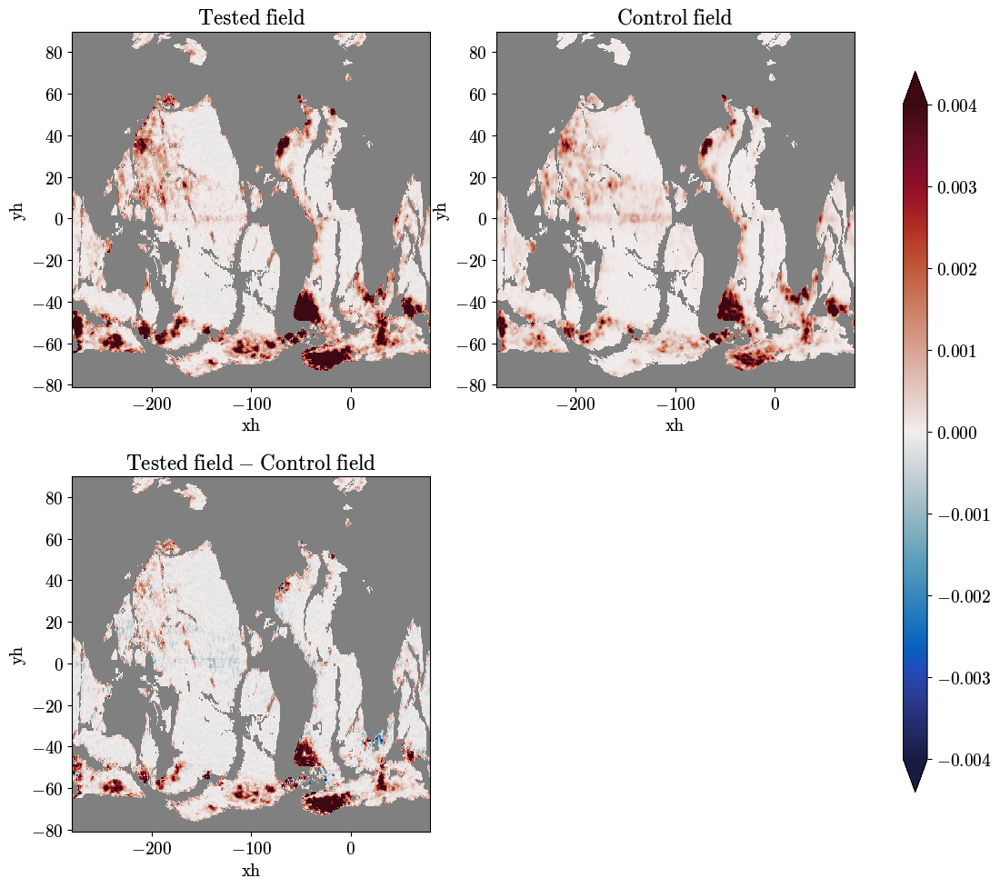

In [60]:
compare(skill_flux_64_64['no-scaling-factor-9-depth-0'][9].SGS_KE_pred[-2], skill_flux_20['factor-9-depth-0'][9].SGS_KE[-2], selector=select_globe, vmin=-0.004, vmax=0.004);

Text(0.5, 1.05, '20 neurons')

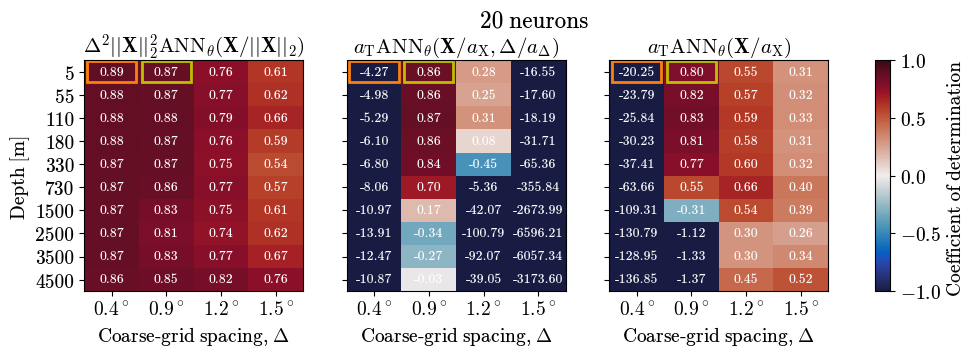

In [78]:
default_rcParams({'figure.subplot.wspace': 0.2, 'figure.subplot.hspace': 0.2, 'font.size':14})
fig = plt.figure(figsize=(12,3))

plt.subplot(1,3,1)
plot_metric(skill_flux_20['factor-9-depth-0'], 'R2T_away', ylabel=True, xlabel=True);
plt.title('$\\Delta^2 ||\\mathbf{X}||_2^2 \\mathrm{ANN}_{\\theta} (\\mathbf{X} / ||\\mathbf{X}||_2)$', fontsize=15)
plt.subplot(1,3,2)
im_R2 = plot_metric(skill_flux_20['dx-input-factor-9-depth-0'], 'R2T_away', xlabel=True);
plt.title('$a_{\mathrm{T}}\\mathrm{ANN}_{\\theta} (\\mathbf{X} / a_{\mathrm{X}}, \Delta/a_{\Delta})$', fontsize=15)
plt.subplot(1,3,3)
im_R2 = plot_metric(skill_flux_20['no-scaling-factor-9-depth-0'], 'R2T_away', xlabel=True);
plt.title('$a_{\mathrm{T}}\\mathrm{ANN}_{\\theta} (\\mathbf{X} / a_{\mathrm{X}})$', fontsize=15)

axes = plt.gcf().axes
plt.colorbar(im_R2, ax=axes[0:3], 
             label='Coefficient of determination ', aspect=15)

plt.suptitle('20 neurons', y=1.05)

Text(0.5, 1.05, '32-32 neurons')

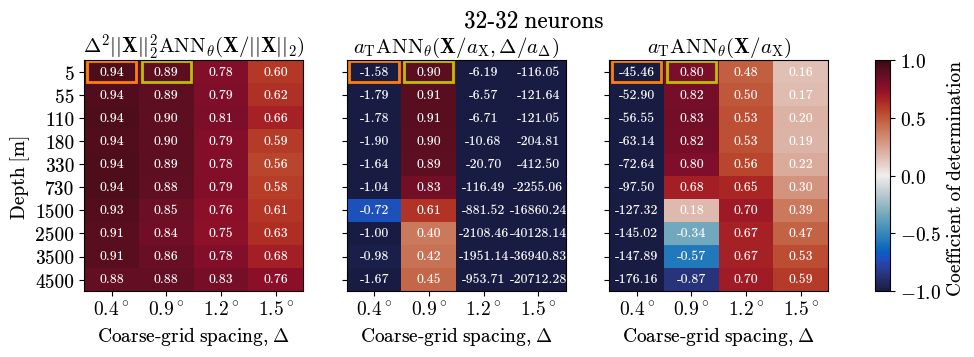

In [81]:
default_rcParams({'figure.subplot.wspace': 0.2, 'figure.subplot.hspace': 0.2, 'font.size':14})
fig = plt.figure(figsize=(12,3))

plt.subplot(1,3,1)
plot_metric(skill_flux_32_32['factor-9-depth-0'], 'R2T_away_centered', ylabel=True, xlabel=True);
plt.title('$\\Delta^2 ||\\mathbf{X}||_2^2 \\mathrm{ANN}_{\\theta} (\\mathbf{X} / ||\\mathbf{X}||_2)$', fontsize=15)
plt.subplot(1,3,2)
im_R2 = plot_metric(skill_flux_32_32['dx-input-factor-9-depth-0'], 'R2T_away_centered', xlabel=True);
plt.title('$a_{\mathrm{T}}\\mathrm{ANN}_{\\theta} (\\mathbf{X} / a_{\mathrm{X}}, \Delta/a_{\Delta})$', fontsize=15)
plt.subplot(1,3,3)
im_R2 = plot_metric(skill_flux_32_32['no-scaling-factor-9-depth-0'], 'R2T_away_centered', xlabel=True);
plt.title('$a_{\mathrm{T}}\\mathrm{ANN}_{\\theta} (\\mathbf{X} / a_{\mathrm{X}})$', fontsize=15)

axes = plt.gcf().axes
plt.colorbar(im_R2, ax=axes[0:3], 
             label='Coefficient of determination ', aspect=15)

plt.suptitle('32-32 neurons', y=1.05)

Text(0.5, 1.05, '64-64 neurons')

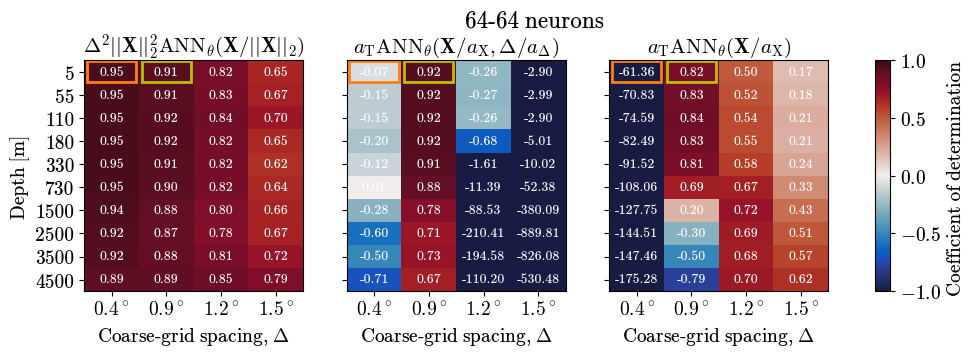

In [83]:
default_rcParams({'figure.subplot.wspace': 0.2, 'figure.subplot.hspace': 0.2, 'font.size':14})
fig = plt.figure(figsize=(12,3))

plt.subplot(1,3,1)
plot_metric(skill_flux_64_64['factor-9-depth-0'], 'R2T_away_centered', ylabel=True, xlabel=True);
plt.title('$\\Delta^2 ||\\mathbf{X}||_2^2 \\mathrm{ANN}_{\\theta} (\\mathbf{X} / ||\\mathbf{X}||_2)$', fontsize=15)
plt.subplot(1,3,2)
im_R2 = plot_metric(skill_flux_64_64['dx-input-factor-9-depth-0'], 'R2T_away_centered', xlabel=True);
plt.title('$a_{\mathrm{T}}\\mathrm{ANN}_{\\theta} (\\mathbf{X} / a_{\mathrm{X}}, \Delta/a_{\Delta})$', fontsize=15)
plt.subplot(1,3,3)
im_R2 = plot_metric(skill_flux_64_64['no-scaling-factor-9-depth-0'], 'R2T_away_centered', xlabel=True);
plt.title('$a_{\mathrm{T}}\\mathrm{ANN}_{\\theta} (\\mathbf{X} / a_{\mathrm{X}})$', fontsize=15)

axes = plt.gcf().axes
plt.colorbar(im_R2, ax=axes[0:3], 
             label='Coefficient of determination ', aspect=15)

plt.suptitle('64-64 neurons', y=1.05)

# Skill on Train versus test datasets

In [11]:
ds_scaling = xr.open_dataset('/scratch/pp2681/mom6/CM26_ML_models/ocean3d/subfilter-large/FGR3/dimensional-scaling/32-32/factor-9-depth-0/model/logger.nc').squeeze()

In [20]:
ds_dx_input = xr.open_dataset('/scratch/pp2681/mom6/CM26_ML_models/ocean3d/subfilter/FGR3/dimensional-scaling/32-32/dx-input-factor-9-depth-0/model/logger.nc').squeeze()

Text(0.5, 1.0, '$a_{\\mathrm{T}}\\mathrm{ANN}_{\\theta} (\\mathbf{X} / a_{\\mathrm{X}}, \\Delta/a_{\\Delta})$')

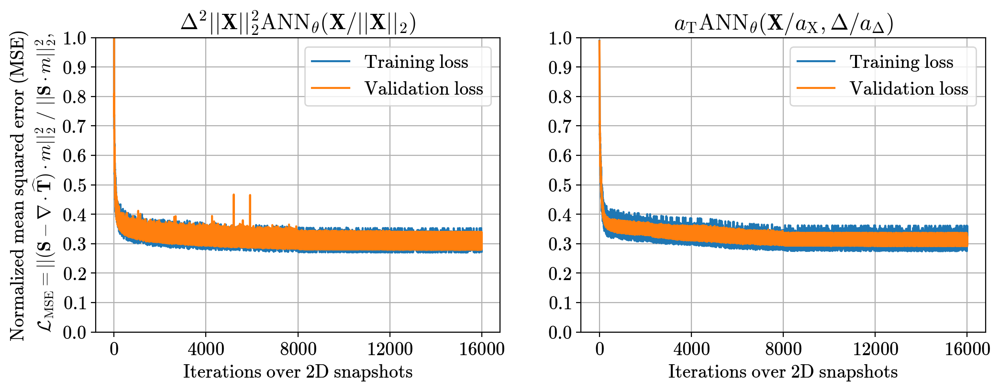

In [47]:
default_rcParams({'figure.subplot.wspace': 0.2, 'figure.subplot.hspace': 0.2, 'font.size':14})
plt.figure(figsize=(12,4), dpi=200)
plt.subplot(1,2,1)
ds_scaling.MSE_train.plot(label='Training loss')
ds_scaling.MSE_validate.plot(label='Validation loss')
plt.ylabel('Normalized mean squared error (MSE)\n $\\mathcal{L}_{\\mathrm{MSE}} = ||(\\mathbf{S} - \\nabla \\cdot \\widehat{\\mathbf{T}}) \\cdot m ||_2^2 ~ / ~||\\mathbf{S} \\cdot m||_2^2, $')
plt.xlabel('Iterations over 2D snapshots')
plt.legend()
plt.ylim([0, 1])
plt.yticks(np.linspace(0,1,11))
plt.xticks([0,4000,8000,12000,16000])
plt.grid()
plt.title('$\\Delta^2 ||\\mathbf{X}||_2^2 \\mathrm{ANN}_{\\theta} (\\mathbf{X} / ||\\mathbf{X}||_2)$')

plt.subplot(1,2,2)
ds_dx_input.MSE_train.plot(label='Training loss')
ds_dx_input.MSE_validate.plot(label='Validation loss')
plt.ylabel('')
plt.xlabel('Iterations over 2D snapshots')
plt.legend()
plt.ylim([0, 1])
plt.yticks(np.linspace(0,1,11))
plt.xticks([0,4000,8000,12000,16000])
plt.grid()
plt.title('$a_{\mathrm{T}}\\mathrm{ANN}_{\\theta} (\\mathbf{X} / a_{\mathrm{X}}, \Delta/a_{\Delta})$')

In [5]:
for key in ['factor-9-depth-0']:
    skill[key+'-train'] = read_skill(f'subfilter-large/FGR3/dimensional-scaling/32-32/{key}', test='train');

In [6]:
for key in ['dx-input-factor-9-depth-0']:
    skill[key+'-train'] = read_skill(f'subfilter/FGR3/dimensional-scaling/32-32/{key}', test='train');

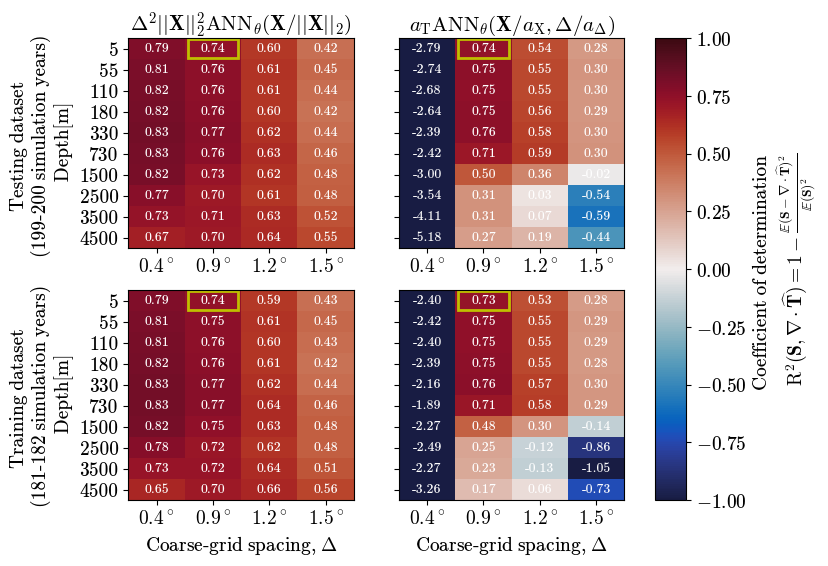

In [9]:
default_rcParams({'figure.subplot.wspace': 0.2, 'figure.subplot.hspace': 0.2, 'font.size':14})
fig = plt.figure(figsize=(8,6))

plt.subplot(2,2,1)
plot_metric(skill['factor-9-depth-0'], 'R2_away', ylabel=True, xlabel=True, add_orange_rectangle=False);
plt.title('$\\Delta^2 ||\\mathbf{X}||_2^2 \\mathrm{ANN}_{\\theta} (\\mathbf{X} / ||\\mathbf{X}||_2)$', fontsize=15)
plt.xlabel('')
plt.ylabel('Testing dataset \n(199-200 simulation years) \n Depth[m]')
plt.subplot(2,2,2)
im_R2 = plot_metric(skill['dx-input-factor-9-depth-0'], 'R2_away', xlabel=True, add_orange_rectangle=False);
plt.title('$a_{\mathrm{T}}\\mathrm{ANN}_{\\theta} (\\mathbf{X} / a_{\mathrm{X}}, \Delta/a_{\Delta})$', fontsize=15)
plt.xlabel('')

plt.subplot(2,2,3)
plot_metric(skill['factor-9-depth-0-train'], 'R2_away', ylabel=True, xlabel=True, add_orange_rectangle=False);
plt.ylabel('Training dataset \n(181-182 simulation years)\n Depth[m]')
#plt.title('$\\Delta^2 ||\\mathbf{X}||_2^2 \\mathrm{ANN}_{\\theta} (\\mathbf{X} / ||\\mathbf{X}||_2)$', fontsize=15)
plt.subplot(2,2,4)
im_R2 = plot_metric(skill['dx-input-factor-9-depth-0-train'], 'R2_away', xlabel=True, add_orange_rectangle=False);
#plt.title('$a_{\mathrm{T}}\\mathrm{ANN}_{\\theta} (\\mathbf{X} / a_{\mathrm{X}}, \Delta/a_{\Delta})$', fontsize=15)


axes = plt.gcf().axes
plt.colorbar(im_R2, ax=axes[0:4], 
             label='Coefficient of determination \n$\mathrm{R}^2(\\mathbf{S},\\nabla\\cdot\\widehat{\\mathbf{T}})=1-\\frac{\\mathbb{E}(\\mathbf{S}-\\nabla\\cdot\\widehat{\\mathbf{T}})^2}{\\mathbb{E}(\mathbf{S})^2}$', aspect=15)
plt.savefig('figures/training-testing.png', dpi=200)

# PDFs near the surface and at depth

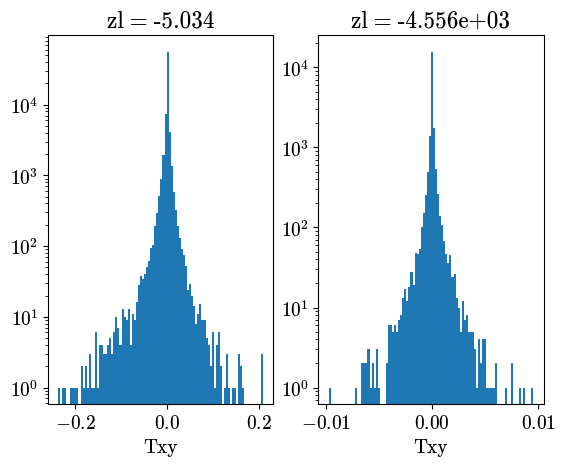

In [28]:
plt.subplot(1,2,1)
skill['factor-9-depth-0'][9].Txy.isel(zl=0).plot.hist(bins=100);
plt.yscale('log')
plt.subplot(1,2,2)
skill['factor-9-depth-0'][9].Txy.isel(zl=-1).plot.hist(bins=100);
plt.yscale('log')

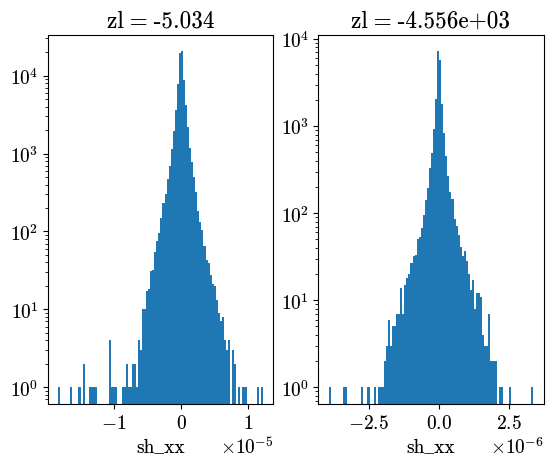

In [29]:
plt.subplot(1,2,1)
skill['factor-9-depth-0'][9].sh_xx.isel(zl=0).plot.hist(bins=100);
plt.yscale('log')
plt.subplot(1,2,2)
skill['factor-9-depth-0'][9].sh_xx.isel(zl=-1).plot.hist(bins=100);
plt.yscale('log')

# Variation of local grid spacing

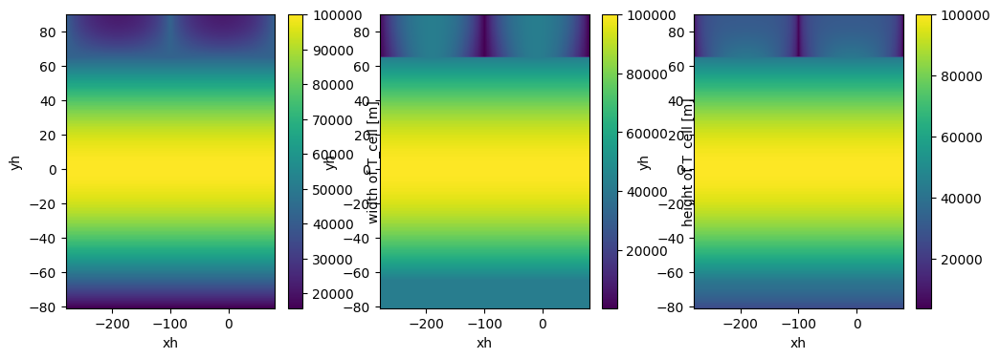

In [7]:
plt.figure(figsize=(12,4))

plt.subplot(1,3,1)
param_9.dxT.plot()

plt.subplot(1,3,2)
param_9.dyT.plot()

plt.subplot(1,3,3)
np.sqrt(param_9.dxT * param_9.dyT).plot()

In [3]:
training_data = read_datasets(['test'], factors=[4,9,12,15], subfilter='subfilter')
param_4 = training_data['test-4'].param
param_9 = training_data['test-9'].param
param_12 = training_data['test-12'].param
param_15 = training_data['test-15'].param

Reading from folder /vast/pp2681/CM26_datasets/ocean3d/subfilter/FGR3/factor-4
Reading from folder /vast/pp2681/CM26_datasets/ocean3d/subfilter/FGR3/factor-9
Reading from folder /vast/pp2681/CM26_datasets/ocean3d/subfilter/FGR3/factor-12
Reading from folder /vast/pp2681/CM26_datasets/ocean3d/subfilter/FGR3/factor-15


In [11]:
def grid_spacing(param, lat=slice(-60,60)):
    '''
    Grid spacing as we define it in parameterization in kilometers
    '''
    return np.sqrt(param.dxT * param.dyT).mean('xh').sel(yh=lat) * 1e-3

4 22.291529519759017 44.4778521066884
9 50.042661202393944 100.07458296576209
12 66.87526566123506 133.4308467278776
15 84.92720152152789 166.7757317017052


(0.0, 200.0)

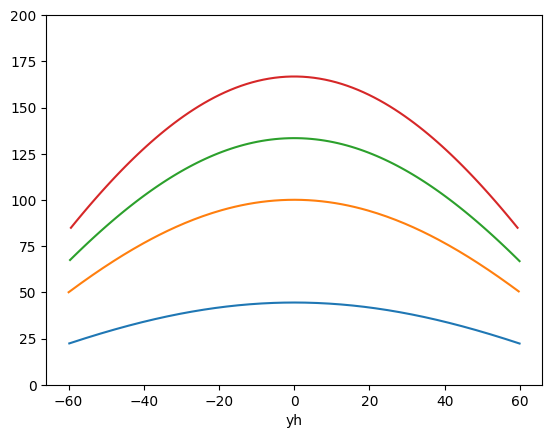

In [14]:
for factor in [4,9,12,15]:
    dx = grid_spacing(training_data[f'test-{factor}'].param)
    print(factor, float(dx.min()), float(dx.max()))
    dx.plot()
    
plt.ylim([0,200])

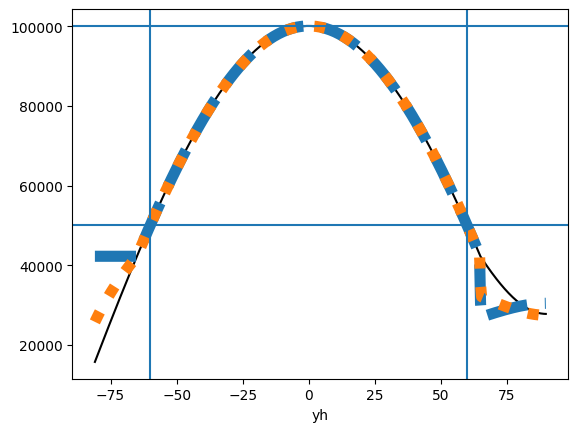

In [28]:
param_9.dxT.mean('xh').plot(color='k')
param_9.dyT.mean('xh').plot(ls='--', lw=8)
np.sqrt(param_9.dyT * param_9.dxT).mean('xh').plot(ls=':', lw=8, color='tab:orange')
plt.axvline(x=-60)
plt.axvline(x=60)
plt.axhline(y=50000)
plt.axhline(y=100000)

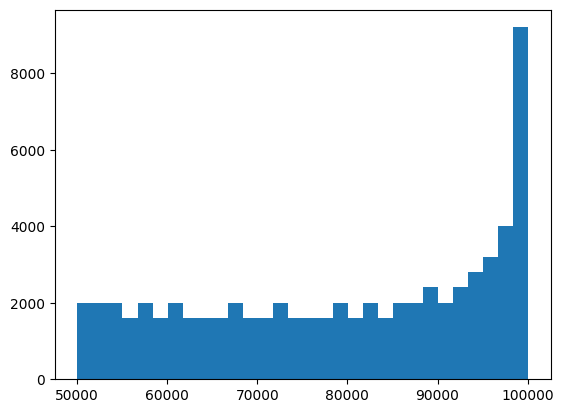

In [27]:
np.sqrt(param_9.dyT * param_9.dxT).sel(yh=slice(-60,60)).plot.hist(bins=30);

# Recompute test skill

In [2]:
from helpers.ann_tools import import_ANN
from helpers.feature_extractors import grid_step

EXP1 = import_ANN('/scratch/pp2681/mom6/CM26_ML_models/ocean3d/subfilter/FGR3/EXP-32-32/repeat/model/Tall.nc')
EXP2 = import_ANN('/scratch/pp2681/mom6/CM26_ML_models/ocean3d/subfilter/FGR3/EXP-32-32/1x1/model/Tall.nc')
#EXP2 = import_ANN('/scratch/pp2681/mom6/CM26_ML_models/ocean3d/subfilter-large/FGR3/dimensional-scaling/32-32/factor-9-depth-0/model/Tall.nc')
#EXP3 = import_ANN('/scratch/pp2681/mom6/CM26_ML_models/ocean3d/subfilter/FGR3/dimensional-scaling/32-32/dx-input-factor-9-depth-0/model/Tall.nc')

In [3]:
EXP1.count_parameters()

2051

In [4]:
ds = read_datasets(['test'], [4,9,12,15], subfilter='subfilter', FGR=3)

Reading from folder /vast/pp2681/CM26_datasets/ocean3d/subfilter/FGR3/factor-4
Reading from folder /vast/pp2681/CM26_datasets/ocean3d/subfilter/FGR3/factor-9
Reading from folder /vast/pp2681/CM26_datasets/ocean3d/subfilter/FGR3/factor-12
Reading from folder /vast/pp2681/CM26_datasets/ocean3d/subfilter/FGR3/factor-15


In [5]:
# #Subset the data to simplify prediction
# ds['train-4'].select2d(zl=slice(None,None), time=slice(0,24))

In [8]:
#sel = lambda x: x.select2d(zl=slice(None,None), time=slice(0,24))

import gc
for factor in [15,12,9,4]:
    %time skill = (ds[f'test-{factor}']).predict_ANN(None, None, EXP1, \
                                      stencil_size=3, dimensional_scaling=True, \
                                      gradient_features=['sh_xy', 'sh_xx', 'rel_vort']).SGS_skill()
    skill.to_netcdf(f'/scratch/pp2681/mom6/CM26_ML_models/ocean3d/subfilter/FGR3/EXP-32-32/repeat/skill-test/factor-{factor}.nc')
    del skill
    gc.collect()

CPU times: user 4min, sys: 11.9 s, total: 4min 12s
Wall time: 1min 48s
CPU times: user 3min 20s, sys: 18.4 s, total: 3min 38s
Wall time: 2min
CPU times: user 4min 27s, sys: 36.4 s, total: 5min 3s
Wall time: 2min 52s
CPU times: user 12min 52s, sys: 4min 21s, total: 17min 14s
Wall time: 10min 20s


In [9]:
#sel = lambda x: x.select2d(zl=slice(None,None), time=slice(0,24))

import gc
for factor in [15,12,9,4]:
    %time skill = (ds[f'test-{factor}']).predict_ANN(None, None, EXP2, \
                                      stencil_size=1, dimensional_scaling=True, \
                                      gradient_features=['sh_xy', 'sh_xx', 'rel_vort']).SGS_skill()
    skill.to_netcdf(f'/scratch/pp2681/mom6/CM26_ML_models/ocean3d/subfilter/FGR3/EXP-32-32/1x1/skill-test/factor-{factor}.nc')
    del skill
    gc.collect()

CPU times: user 3min 2s, sys: 9.39 s, total: 3min 12s
Wall time: 1min 37s
CPU times: user 5min 37s, sys: 16.8 s, total: 5min 54s
Wall time: 2min 16s
CPU times: user 6min 23s, sys: 28.7 s, total: 6min 52s
Wall time: 2min 58s
CPU times: user 10min 13s, sys: 2min 52s, total: 13min 5s
Wall time: 9min 39s


# Test if new inference function able to fetch grid spacing data

In [70]:
from helpers.train_ann import train_ANN

In [80]:
ann_forcing = train_ANN(loss_function='forcing')

Reading from folder /vast/pp2681/CM26_datasets/ocean3d/subfilter/FGR3/factor-9
Reading from folder /vast/pp2681/CM26_datasets/ocean3d/subfilter/FGR3/factor-9
Factor: 9, depth: 0, MSE train/validate: [2.044555, 2.167333]
Iter/num_iters [1/50]. Iter time/Remaining time in seconds: [1.77/86.9]
Factor: 9, depth: 0, MSE train/validate: [1.420779, 1.721878]
Iter/num_iters [2/50]. Iter time/Remaining time in seconds: [1.69/83.1]
Factor: 9, depth: 0, MSE train/validate: [1.047158, 1.314964]
Iter/num_iters [3/50]. Iter time/Remaining time in seconds: [1.75/81.6]
Factor: 9, depth: 0, MSE train/validate: [0.902538, 0.961018]
Iter/num_iters [4/50]. Iter time/Remaining time in seconds: [1.71/79.5]
Factor: 9, depth: 0, MSE train/validate: [0.905315, 0.881151]
Iter/num_iters [5/50]. Iter time/Remaining time in seconds: [1.76/78.1]
Factor: 9, depth: 0, MSE train/validate: [0.957206, 0.925006]
Iter/num_iters [6/50]. Iter time/Remaining time in seconds: [1.69/76.0]
Factor: 9, depth: 0, MSE train/validat

In [81]:
ann_fluxes = train_ANN(loss_function='fluxes')

Reading from folder /vast/pp2681/CM26_datasets/ocean3d/subfilter/FGR3/factor-9
Reading from folder /vast/pp2681/CM26_datasets/ocean3d/subfilter/FGR3/factor-9
Factor: 9, depth: 0, MSE train/validate: [3.840805, 2.764887]
Iter/num_iters [1/50]. Iter time/Remaining time in seconds: [1.79/87.9]
Factor: 9, depth: 0, MSE train/validate: [2.152659, 2.342280]
Iter/num_iters [2/50]. Iter time/Remaining time in seconds: [1.65/82.6]
Factor: 9, depth: 0, MSE train/validate: [1.489575, 1.165004]
Iter/num_iters [3/50]. Iter time/Remaining time in seconds: [1.65/79.7]
Factor: 9, depth: 0, MSE train/validate: [0.804105, 0.881456]
Iter/num_iters [4/50]. Iter time/Remaining time in seconds: [1.65/77.5]
Factor: 9, depth: 0, MSE train/validate: [0.644645, 0.574391]
Iter/num_iters [5/50]. Iter time/Remaining time in seconds: [1.65/75.5]
Factor: 9, depth: 0, MSE train/validate: [0.528473, 0.791423]
Iter/num_iters [6/50]. Iter time/Remaining time in seconds: [1.69/73.9]
Factor: 9, depth: 0, MSE train/validat

In [93]:
sel = lambda x: x.select2d(zl=slice(None,None), time=slice(0,12))
factor = 9
%time skill_forcing = sel(ds[f'train-{factor}']).predict_ANN(None, None, ann_forcing[0], \
                                  stencil_size=3, dimensional_scaling=True, \
                                  gradient_features=['sh_xy', 'sh_xx', 'rel_vort']).SGS_skill()

CPU times: user 1min 46s, sys: 15.8 s, total: 2min 1s
Wall time: 2min 5s


In [ ]:
sel = lambda x: x.select2d(zl=slice(None,None), time=slice(0,12))
factor = 9
%time skill_fluxes = sel(ds[f'train-{factor}']).predict_ANN(None, None, ann_fluxes[0], \
                                  stencil_size=3, dimensional_scaling=True, \
                                  gradient_features=['sh_xy', 'sh_xx', 'rel_vort']).SGS_skill()

In [ ]:
plt.figure(figsize=(20,5))

plt.subplot(1,2,1)
skill_forcing.R2_map[0].plot(vmin=-1)
plt.subplot(1,2,2)
skill_fluxes.R2_map[0].plot(vmin=-1)